#Proyecto Data Science II

**Abstract:**
Se desea encontrar patrones entre el precio de los commodities con respecto a variables macroeconómicas, en particular para el precio del cobre. Para esto se extraen datos de la API Alpha Vantage, estos son formateados y preprocesados abordando la eliminación y sobreescritura de valores nulos y la identificación y sobreescritura de outliers. Posteriormente se realiza un análisis exploratorio de datos para encontrar patrones en los datos y responder a las preguntas de interés. Posteriormente se crean modelos de Machine Learning para predecir el cambio porcentual del precio del cobre, utilizando métodos de validación se escoge el algoritmo con mayor desempeño y se optimizan sus hiperparámetros para obtener el modelo final.

##Data Acquisition

###Extracción de datos de precios de commodities e indicadores económicos

Para la cración del dataset, se extraen datos de la API Alpha Advantage, la cual ofrece una amplia variedad de datos financieros. Esta API permite crear una API Key gratuita que permite realizar hasta 25 consultas al día (https://www.alphavantage.co/).

En base a la documentación de la API (https://www.alphavantage.co/documentation/) se observa que a través de la URL se configura la función a utilizar y los parámetros que se introducen a estas. Para facilitar el trabajo de la creación de estos links y transformar los resultados al formato deseado (en este caso a un dataframe de pandas) se crean dos funciones para facilitar esta tarea.

La primera función nombrada get_data realiza una solicitud a la API para obtener datos de esta y almacena los datos recibidos en un Dataframe de Pandas.

La segunda función get_dataframes recibe como parámetros una lista de nombres de funciones de la PI y una lista de periodos de tiempo. Para cada par de valores de función e intervalo de tiempo esta función utiliza la función get_data para extraer datos de la API. Todos los dataframes obtenidos los almacena en una lista de dataframes la cual es retornada por la función.

In [1]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from io import StringIO
import missingno as msno

In [2]:
# Función para obtener datos de la API de Alpha Vantage
def get_data(function, apikey, interval='monthly'):
    # URL base de la API
    base_url = "https://www.alphavantage.co/query"

    # Parámetros de la solicitud
    params = {
        'function': function,      # Función específica para obtener los datos (e.g., 'BRENT')
        'interval': interval,      # Intervalo de tiempo (puede ser 'daily', 'weekly', 'monthly')
        'apikey': apikey,          # Clave API
        'datatype': 'csv'          # Formato de salida siempre 'csv'
    }

    # Hacer la solicitud GET
    response = requests.get(base_url, params=params)

    # Verificar el estado de la respuesta
    if response.status_code == 200:
        # Convertir el contenido CSV a un DataFrame usando pandas
        csv_data = StringIO(response.text)
        df = pd.read_csv(csv_data)

        # Asegurarse de que el nombre de la columna de timestamp esté unificado
        if 'timestamp' in df.columns:
            df.rename(columns={'timestamp': 'Timestamp'}, inplace=True)

        # Renombrar las columnas OHLCV para que incluyan el nombre del commodity
        df.columns = ['Timestamp'] + [f"{function}_{col}" for col in df.columns[1:]]

        return df  # Devolver el DataFrame
    else:
        print(f"Error: Código de respuesta {response.status_code}")
        return None

# Función para obtener datos de múltiples funciones e intervalos y devolver una lista de DataFrames
def get_dataframes(functions, intervals, apikey):
    dataframes = []  # Lista para almacenar los DataFrames obtenidos

    # Iterar simultáneamente sobre las listas de funciones e intervalos
    for function, interval in zip(functions, intervals):
        print(f"Obteniendo datos para función: {function}, intervalo: {interval}")
        df = get_data(function, apikey, interval)  # Llamar a la función get_data

        if df is not None:
            dataframes.append(df)  # Añadir el DataFrame a la lista

    return dataframes

Con las funciones ya definidas, se utiliza la función get_dataframes para extraer datos del precio de diferentes commodities (Petróleo, cobre, aluminio, café, entre otros) e indicadores económicos de EE.UU (PIB, PIB per capita, taza de política monetaria e indice de precio del consumidor) haciendo uso del siguiente fragmento de código.

Además el código convierte la lista de dataframes en uno unificado.

In [3]:
# Parámetros personalizables
apikey = "INGRESAR AQUÍ API KEY GENERADA"
functions = ['WTI', 'BRENT', 'NATURAL_GAS', 'COPPER', 'ALUMINUM', 'WHEAT', 'CORN', 'COTTON', 'SUGAR', 'COFFEE', 'ALL_COMMODITIES', 'REAL_GDP', 'REAL_GDP_PER_CAPITA', 'FEDERAL_FUNDS_RATE', 'CPI']  # Lista de funciones (e.g., 'BRENT', 'WTI')
intervals = ['daily', 'daily', 'daily', 'monthly', 'monthly', 'monthly', 'monthly', 'monthly', 'monthly', 'monthly', 'monthly', 'quarterly', 'quarterly', 'daily', 'monthly']  # Lista de intervalos emparejados con las funciones

# Llamar a la función y obtener la lista de DataFrames
dataframes = get_dataframes(functions, intervals, apikey)

# Mostrar las primeras filas de cada DataFrame en la lista
#for df in dataframes:
#    if df is not None:
#        print(df.head())

# Combinar todos los DataFrames en la lista en un solo DataFrame
merged_df = dataframes[0]
for i in range(1, len(dataframes)):
  if dataframes[i] is not None:
    merged_df = pd.merge(merged_df, dataframes[i], on='Timestamp', how='outer')

print(merged_df.head())
print(merged_df.info())

Obteniendo datos para función: WTI, intervalo: daily
Obteniendo datos para función: BRENT, intervalo: daily
Obteniendo datos para función: NATURAL_GAS, intervalo: daily
Obteniendo datos para función: COPPER, intervalo: monthly
Obteniendo datos para función: ALUMINUM, intervalo: monthly
Obteniendo datos para función: WHEAT, intervalo: monthly
Obteniendo datos para función: CORN, intervalo: monthly
Obteniendo datos para función: COTTON, intervalo: monthly
Obteniendo datos para función: SUGAR, intervalo: monthly
Obteniendo datos para función: COFFEE, intervalo: monthly
Obteniendo datos para función: ALL_COMMODITIES, intervalo: monthly
Obteniendo datos para función: REAL_GDP, intervalo: quarterly
Obteniendo datos para función: REAL_GDP_PER_CAPITA, intervalo: quarterly
Obteniendo datos para función: FEDERAL_FUNDS_RATE, intervalo: daily
Obteniendo datos para función: CPI, intervalo: monthly
    Timestamp WTI_value BRENT_value NATURAL_GAS_value COPPER_value  \
0  1913-01-01       NaN         

### Extracción de datos de rendimiento de bonos del tesoro de EE.UU

Las funciones de la API para obtener datos del rendimiento de los bonos del tesoro de EE.UU tiene parámetros diferentes para generar la solicitud de datos a la API, es por esto que se crea la función get_treasury_yield_data, la cual genera solicitudes a la API para obtener datos del rendimiento de los bonos del tesoro a 3 meses, 2 años, 5 años, 7 años, 10 años y 30 años. Los datos obtenidos son almacenados en una lista de dataframes que es retornada por la función.

In [4]:
# Función para obtener datos del rendimiento del tesoro de EE.UU.
def get_treasury_yield_data(apikey):
    base_url = "https://www.alphavantage.co/query"

    # Opciones de vencimiento
    maturities = ['3month', '2year', '5year', '7year', '10year', '30year']
    interval = 'daily'  # Intervalo diario
    datatype = 'csv'    # Formato CSV
    function = 'TREASURY_YIELD'  # Función específica

    dataframes = []  # Lista para almacenar los DataFrames obtenidos

    for maturity in maturities:
        # Parámetros de la solicitud
        params = {
            'function': function,
            'interval': interval,
            'maturity': maturity,
            'apikey': apikey,
            'datatype': datatype
        }

        # Hacer la solicitud GET
        response = requests.get(base_url, params=params)

        # Verificar el estado de la respuesta
        if response.status_code == 200:
            # Convertir el contenido CSV a un DataFrame usando pandas
            csv_data = StringIO(response.text)
            df = pd.read_csv(csv_data)

            # Asegurarse de que el nombre de la columna de timestamp esté unificado
            if 'timestamp' in df.columns:
                df.rename(columns={'timestamp': 'Timestamp'}, inplace=True)

            # Renombrar las columnas para incluir el vencimiento
            df.columns = ['Timestamp'] + [f"{maturity}_{col}" for col in df.columns[1:]]

            dataframes.append(df)  # Añadir el DataFrame a la lista
        else:
            print(f"Error para vencimiento {maturity}: Código de respuesta {response.status_code}")

    return dataframes  # Devolver la lista de DataFrames

El siguiente fragmento de código llama a la función get_treasury_yield_data, combina los dataframes obtenidos a uno solo llamado merged_df2:

In [5]:
dataframes = get_treasury_yield_data(apikey)

# Combinar todos los DataFrames en la lista en un solo DataFrame
merged_df2 = dataframes[0]
for i in range(1, len(dataframes)):
  if dataframes[i] is not None:
    merged_df2 = pd.merge(merged_df2, dataframes[i], on='Timestamp', how='outer')

print(merged_df2.head())
print(merged_df2.info())

    Timestamp 3month_value 2year_value 5year_value 7year_value 10year_value  \
0  1962-01-02          NaN         NaN        3.88         NaN         4.06   
1  1962-01-03          NaN         NaN        3.87         NaN         4.03   
2  1962-01-04          NaN         NaN        3.86         NaN         3.99   
3  1962-01-05          NaN         NaN        3.89         NaN         4.02   
4  1962-01-08          NaN         NaN        3.91         NaN         4.03   

  30year_value  
0          NaN  
1          NaN  
2          NaN  
3          NaN  
4          NaN  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16407 entries, 0 to 16406
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Timestamp     16407 non-null  object
 1   3month_value  11277 non-null  object
 2   2year_value   12647 non-null  object
 3   5year_value   16407 non-null  object
 4   7year_value   14452 non-null  object
 5   10year_value  16

In [6]:
print(merged_df2.head())
print(merged_df2.info())

    Timestamp 3month_value 2year_value 5year_value 7year_value 10year_value  \
0  1962-01-02          NaN         NaN        3.88         NaN         4.06   
1  1962-01-03          NaN         NaN        3.87         NaN         4.03   
2  1962-01-04          NaN         NaN        3.86         NaN         3.99   
3  1962-01-05          NaN         NaN        3.89         NaN         4.02   
4  1962-01-08          NaN         NaN        3.91         NaN         4.03   

  30year_value  
0          NaN  
1          NaN  
2          NaN  
3          NaN  
4          NaN  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16407 entries, 0 to 16406
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Timestamp     16407 non-null  object
 1   3month_value  11277 non-null  object
 2   2year_value   12647 non-null  object
 3   5year_value   16407 non-null  object
 4   7year_value   14452 non-null  object
 5   10year_value  16

###Generando dataset final

In [7]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26209 entries, 0 to 26208
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Timestamp                  26209 non-null  object 
 1   WTI_value                  10143 non-null  object 
 2   BRENT_value                9784 non-null   object 
 3   NATURAL_GAS_value          7270 non-null   object 
 4   COPPER_value               538 non-null    object 
 5   ALUMINUM_value             538 non-null    object 
 6   WHEAT_value                538 non-null    object 
 7   CORN_value                 538 non-null    object 
 8   COTTON_value               538 non-null    object 
 9   SUGAR_value                538 non-null    object 
 10  COFFEE_value               538 non-null    object 
 11  ALL_COMMODITIES_value      394 non-null    object 
 12  REAL_GDP_value             91 non-null     float64
 13  REAL_GDP_PER_CAPITA_value  311 non-null    flo

Hasta este punto se tienen dos dataset merged_df con los datos de commodities y macroeconómicos de EE.UU y merged_df2 con los datos de rendimiento de bonos del tesoro de EE.UU para diferentes periodos. La siguiente línea de código combina ámbos dataframe a uno denominado final_df con el cual se da por finalizada la creación del dataframe. Este posee los datos crudos, los cuales serán procesados en la etapa de Data Wrangling.

In [8]:
final_df = pd.merge(merged_df, merged_df2, on='Timestamp', how='outer')

In [9]:
final_df.head()

,Timestamp,WTI_value,BRENT_value,NATURAL_GAS_value,COPPER_value,ALUMINUM_value,WHEAT_value,CORN_value,COTTON_value,SUGAR_value,...,REAL_GDP_value,REAL_GDP_PER_CAPITA_value,FEDERAL_FUNDS_RATE_value,CPI_value,3month_value,2year_value,5year_value,7year_value,10year_value,30year_value
0,1913-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,9.8,NaN,NaN,NaN,NaN,NaN,NaN
1,1913-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,9.8,NaN,NaN,NaN,NaN,NaN,NaN
2,1913-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,9.8,NaN,NaN,NaN,NaN,NaN,NaN
3,1913-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,9.8,NaN,NaN,NaN,NaN,NaN,NaN
4,1913-05-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,9.7,NaN,NaN,NaN,NaN,NaN,NaN


Como se observa en la ejecución de la siguiente línea de código, el dataset resultante posee 26154 filas y 21 columnas. Algunas columnas poseen una cantidad mucho menor de valores no nulos respecto a otras. Esto se debe a que algunos de los datos obtenidos de la api son de frecuencia mensual y otros datos son de frecuencia diaria. Este aspecto será compensado en la sección de Data Wrangling.

In [10]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26209 entries, 0 to 26208
Data columns (total 22 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Timestamp                  26209 non-null  object 
 1   WTI_value                  10143 non-null  object 
 2   BRENT_value                9784 non-null   object 
 3   NATURAL_GAS_value          7270 non-null   object 
 4   COPPER_value               538 non-null    object 
 5   ALUMINUM_value             538 non-null    object 
 6   WHEAT_value                538 non-null    object 
 7   CORN_value                 538 non-null    object 
 8   COTTON_value               538 non-null    object 
 9   SUGAR_value                538 non-null    object 
 10  COFFEE_value               538 non-null    object 
 11  ALL_COMMODITIES_value      394 non-null    object 
 12  REAL_GDP_value             91 non-null     float64
 13  REAL_GDP_PER_CAPITA_value  311 non-null    flo

A continuación se detallan las columnas creadas del dataset:

* Timestamp: Marca temporal que indica el momento de los datos.
* WTI_value: Precio del crudo WTI (petróleo estado unidense).
* BRENT_value: Precio del crudo Brent (petróleo europeo).
* NATURAL_GAS_value: Precio del gas natural.
* COPPER_value: Precio del cobre.
* ALUMINUM_value: Precio del aluminio.
* WHEAT_value: Precio del trigo.
* CORN_value: Precio del maíz.
* COTTON_value: Precio del algodón.
* SUGAR_value: Precio del azúcar.
* COFFEE_value: Precio del café.
* ALL_COMMODITIES_value: Índice general de todas las mercancías.
* REAL_GDP_value: Producto Interno Bruto (PIB) real.
* REAL_GDP_PER_CAPITA_value: PIB real per cápita.
* FEDERAL_FUNDS_RATE_value: Tasa de política monetaria en EEUU.
* CPI_value: Índice de Precios al Consumidor (CPI).
* 3month_value: Rendimiento de bonos del tesoro de EE.UU a 3 meses.
* 2year_value: Rendimiento de bonos del tesoro de EE.UU bono a 2 años.
* 5year_value: Rendimiento de bonos del tesoro de EE.UU bono a 5 años.
* 7year_value: Rendimiento de bonos del tesoro de EE.UU bono a 7 años.
* 10year_value: Rendimiento de bonos del tesoro de EE.UU bono a 10 años.
* 30year_value: Rendimiento de bonos del tesoro de EE.UU bono a 30 años.

Ejecutar esta celda de código opcionalmente si se desea guardar el dataset a un archivo csv

In [11]:
final_df.to_csv('final_df.csv', index=False)

Si se carga el dataset desde un archivo csv ejecutar esta celda de código.

In [12]:
final_df = pd.read_csv('final_df.csv')

##Data Wrangling


En esta sección se realiza el preprocesamiento de los datos para convertir el dataset en uno mas limpio y preparado para ser utilizado para el análisis exploratorio de datos y posteriormente para la creación de modelos de Machine Learning. Como primer paso se formatean las columnas al formato deseado, luego se realiza el tratamiento de valores nulos y finalmente se realiza el tratamiento de valores atipicos (outliers).

###Formateo de Columnas

Todas las columnas del dataset, excepto la columna Timestamp contienen valores numéricos decimales, por lo tanto se formatea la columna Timestamp como tipo datetime64 y el resto de las columnas como float64 de dos decimales utilizando el siguiente fragmento de código:

In [13]:

# Convert 'Timestamp' column to datetime64
final_df['Timestamp'] = pd.to_datetime(final_df['Timestamp'])

# Convert all other columns to float
for column in final_df.columns:
  if column != 'Timestamp':
    final_df[column] = pd.to_numeric(final_df[column], errors='coerce').round(2)


# Print info to verify changes
print(final_df.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26209 entries, 0 to 26208
Data columns (total 22 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Timestamp                  26209 non-null  datetime64[ns]
 1   WTI_value                  9792 non-null   float64       
 2   BRENT_value                9517 non-null   float64       
 3   NATURAL_GAS_value          7003 non-null   float64       
 4   COPPER_value               418 non-null    float64       
 5   ALUMINUM_value             418 non-null    float64       
 6   WHEAT_value                418 non-null    float64       
 7   CORN_value                 418 non-null    float64       
 8   COTTON_value               418 non-null    float64       
 9   SUGAR_value                418 non-null    float64       
 10  COFFEE_value               418 non-null    float64       
 11  ALL_COMMODITIES_value      262 non-null    float64       
 12  REAL

Con las columnas ya formateadas se puede utilizar el método describe para tener una idea general de los rangos de valores de los datos, su distribución y orden de magnitud de sus valores.

In [14]:
final_df.describe().round(2).T

,count,mean,min,25%,50%,75%,max,std
Timestamp,26209,1988-08-17 11:00:31.454843776,1913-01-01 00:00:00,1971-01-27 00:00:00,1989-01-04 00:00:00,2006-12-13 00:00:00,2024-11-20 00:00:00,NaN
WTI_value,9792.0,47.54,-36.98,20.19,40.05,71.33,145.31,29.68
BRENT_value,9517.0,50.21,9.1,19.35,43.25,74.68,143.95,32.88
NATURAL_GAS_value,7003.0,4.11,1.05,2.57,3.41,5.16,23.86,2.18
COPPER_value,418.0,4867.63,1377.38,2218.38,4832.4,7219.59,10230.89,2721.24
ALUMINUM_value,418.0,1834.12,1040.02,1473.88,1754.73,2129.12,3498.37,467.35
WHEAT_value,418.0,183.75,88.55,134.12,165.04,219.72,444.16,68.22
CORN_value,418.0,160.56,75.06,105.75,151.56,189.01,348.51,67.51
COTTON_value,418.0,77.84,37.22,60.27,75.68,87.19,229.67,24.91
SUGAR_value,418.0,13.58,5.11,9.55,12.32,17.38,29.74,5.43


###Manejo de valores nulos

Para realizar la identificación y manejo de valores nulos, como primer paso se utiliza el siguiente código que verifica que los timestamp están ordenados de fecha más actual a más antigua. En caso que esto no se cumpla el código reordena las filas del dataframe.

In [15]:
# Check if Timestamp column is sorted in descending order
if not final_df['Timestamp'].is_monotonic_decreasing:
  # Sort the DataFrame by Timestamp in descending order
  final_df = final_df.sort_values('Timestamp', ascending=False)
  final_df = final_df.reset_index(drop=True)

# Verify that the Timestamp column is sorted
print(final_df['Timestamp'].is_monotonic_decreasing)


True


Para observar de mejor manera cómo se distribuyen los valores nulos se crea una matriz de valores nulos. Al observar los valores resultantes de la matriz se observa que las columnas COPPER_value, ALUMINIUM_value, WHEAT_value, CORN__value, COTTON_value, SUGAR_value, COFFEE_value, ALL_COMMODITIES_value y CPI_value poseen una gran cantidad de valores nulos. Esto se debe a que la API entregó valores para estas columnas con frecuencia mensual, en vez de frecuencia diaria. De igual manera las columnas REAL_GDP_value y REAL_GDP_PER_CAPITA_value posee datos con frecuencia trimestral.

<Axes: >

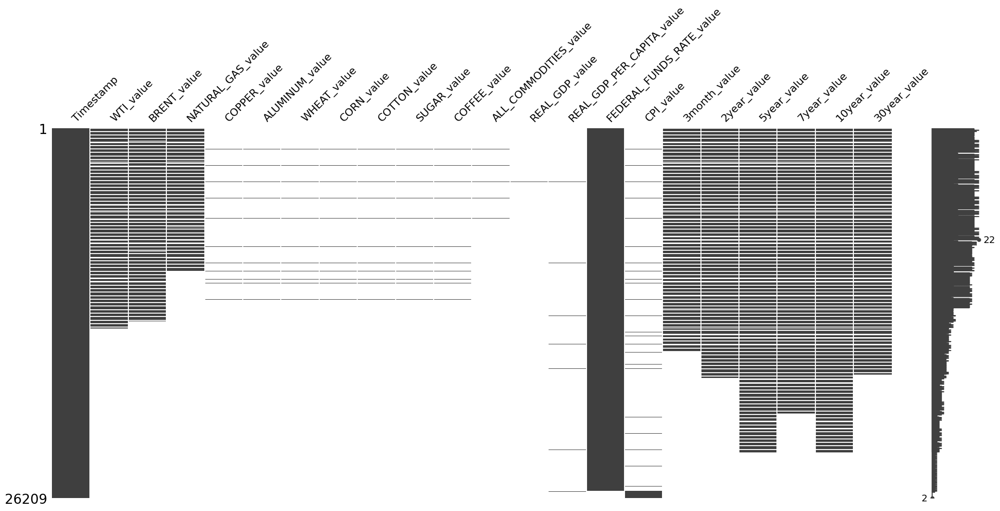

In [16]:
msno.matrix(final_df)

Como se observa en la matriz de valores nulos anterior, algunas columnas poseen datos a partir de fechas mas antiguas que otras columnas. Ya que se desea hacer un análisis de los commodities es importante que el horizonte de tiempo del análisis sea tal que se posean suficientes datos de estos.

Es por esto que de decide identificar la fecha del dato mas antiguo de la columna Natural_Gas_value, todas las filas mas antiguas a esta fecha serán eliminadas.

El siguiente código es utilizado para identificar la fecha mas antigua de Natural_Gas_value que posee un valor no nulo.

In [17]:
natural_gas_not_null = final_df.dropna(subset=['NATURAL_GAS_value'])
if not natural_gas_not_null.empty:
  oldest_date = natural_gas_not_null['Timestamp'].min()
  print(f"The oldest date where NATURAL_GAS_value is not empty is: {oldest_date}")
else:
  print("NATURAL_GAS_value is empty for all dates.")

The oldest date where NATURAL_GAS_value is not empty is: 1997-01-07 00:00:00


Como se observa, el primero de julio de 1997 es la fecha mas antigua con datos de gas natural, por lo tanto, haciendo uso del siguiente código se eliminan todas las filas del dataset que sean más antiguas a esta fecha.

In [18]:
final_df_since_1997 = final_df[final_df['Timestamp'] >= pd.to_datetime('1997-01-07')]
final_df_since_1997 = final_df_since_1997.reset_index(drop=True)

In [19]:
final_df_since_1997

,Timestamp,WTI_value,BRENT_value,NATURAL_GAS_value,COPPER_value,ALUMINUM_value,WHEAT_value,CORN_value,COTTON_value,SUGAR_value,...,REAL_GDP_value,REAL_GDP_PER_CAPITA_value,FEDERAL_FUNDS_RATE_value,CPI_value,3month_value,2year_value,5year_value,7year_value,10year_value,30year_value
0,2024-11-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,4.58,NaN,4.62,4.31,4.28,4.34,4.41,4.59
1,2024-11-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,4.58,NaN,4.62,4.27,4.25,4.32,4.39,4.57
2,2024-11-18,69.46,74.35,2.08,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,4.58,NaN,4.63,4.29,4.28,4.35,4.42,4.61
3,2024-11-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,4.58,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2024-11-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,4.58,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10175,1997-01-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5.17,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10176,1997-01-10,26.15,24.22,3.92,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5.17,NaN,5.17,6.06,6.40,6.52,6.63,6.86
10177,1997-01-09,26.30,24.83,3.61,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5.25,NaN,5.13,5.94,6.27,6.41,6.52,6.76
10178,1997-01-08,26.55,24.78,3.80,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5.20,NaN,5.16,6.01,6.34,6.49,6.60,6.83


Con esto se ha eliminado aproximadamente la mitad de las columnas del dataset, quedando este con 10125 filas. Para observar como queda la nueva distribución de valores nulos se utiliza la siguiente línea de código para volver a generar la matriz de valores nulos. Ahora se puede observar que las columnas con datos de frecuencia diaria poseen valores no nulos distribuidos a lo largo de todo el espectro temporal.

Todas las columnas que se mantengan para el análisis tendrán la misma fecha de inicio (primero de julio de 1997), sin embargo aun se debe definir la fecha de término para el análisis. Se observa además en la matriz de no nulos, que los datos obtenidos con frecuencia mensual o trimestral, tienen como fecha mas nuevas valores que aparentemente son la misma fecha o fechas cercanas.

<Axes: >

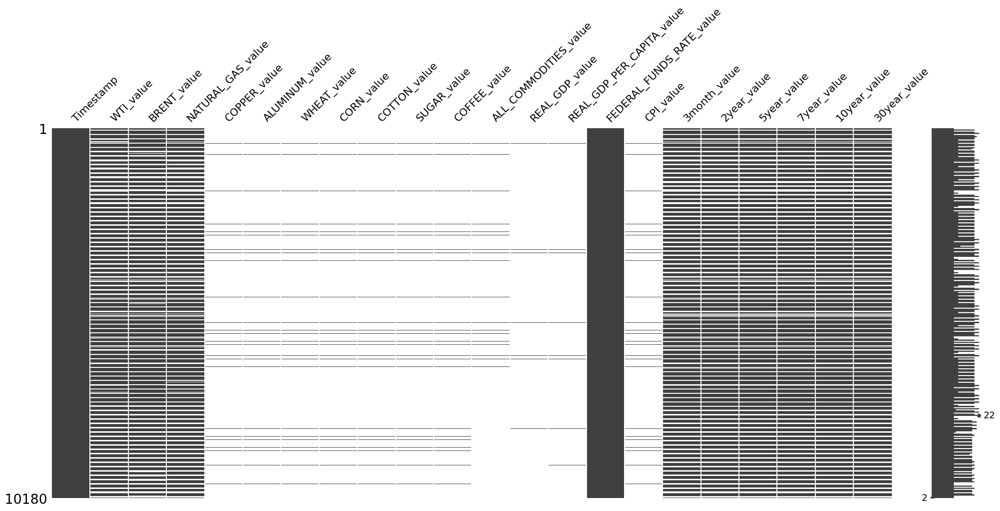

In [20]:
msno.matrix(final_df_since_1997)

Basándose en lo observado en la matriz de valores nulos se decide utilizar como referencia la columna Real_DFP_PER_CAPITA_value e identificar su valor no nulo mas nuevo. Todas las filas con fechas mas nuevas serán eliminadas del dataset. El siguiente código identifica la fila con fecha mas nueva donde REAL_GDP_PER_CAPITA_value posea un valor no nulo.

In [21]:
GDP_not_null = final_df.dropna(subset=['REAL_GDP_PER_CAPITA_value'])
if not GDP_not_null.empty:
  newest_date = GDP_not_null['Timestamp'].max()
  print(f"The newest date where REAL_GDP_PER_CAPITA_value is not empty is: {newest_date}")
else:
  print("REAL_GDP_PER_CAPITA_value is empty for all dates.")

The newest date where REAL_GDP_PER_CAPITA_value is not empty is: 2024-07-01 00:00:00


Como se observa el primero de abril de 2024 es la fecha mas nueva, por lo tanto, haciendo uso del siguiente código se eliminan todas las filas del dataset que sean más nuevas a esta fecha.

In [22]:
final_df_since_1997 = final_df_since_1997[final_df_since_1997['Timestamp'] <= pd.to_datetime('2024-04-01')]
final_df_since_1997 = final_df_since_1997.reset_index(drop=True)

In [23]:
final_df_since_1997

,Timestamp,WTI_value,BRENT_value,NATURAL_GAS_value,COPPER_value,ALUMINUM_value,WHEAT_value,CORN_value,COTTON_value,SUGAR_value,...,REAL_GDP_value,REAL_GDP_PER_CAPITA_value,FEDERAL_FUNDS_RATE_value,CPI_value,3month_value,2year_value,5year_value,7year_value,10year_value,30year_value
0,2024-04-01,84.54,NaN,1.64,9445.59,2499.23,208.38,190.9,90.6,20.65,...,5817.17,68977.0,5.33,313.55,5.44,4.72,4.34,4.33,4.33,4.47
1,2024-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5.33,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2024-03-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5.33,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2024-03-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5.33,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2024-03-28,83.96,86.17,1.54,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5.33,NaN,5.46,4.59,4.21,4.20,4.20,4.34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9942,1997-01-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5.17,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9943,1997-01-10,26.15,24.22,3.92,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5.17,NaN,5.17,6.06,6.40,6.52,6.63,6.86
9944,1997-01-09,26.30,24.83,3.61,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5.25,NaN,5.13,5.94,6.27,6.41,6.52,6.76
9945,1997-01-08,26.55,24.78,3.80,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5.20,NaN,5.16,6.01,6.34,6.49,6.60,6.83


Ya se tiene definido el rango temporal de los datos. Para lidiar con la alta cantidad de valores nulos debido a las columnas de datos con frecuencia mensual o trimestral se decide rellenar los valores nulos utilizando interpolación, es decir, los valores nulos que se encuentran entre dos valores no nulos son reemplazados con los puntos equivalentes a hacer la interpolación entre ellos.

Se decide además eliminar las columnas ALL_COMMODITIES_value y REAL_GDP_value ya que dentro de sus respectivas frecuencias de muestreo poseen muchos intervalos de tiempo con valores nulos.

El siguiente fragmento de código aplica la interpolación y eliminación de columnas señalada.

In [24]:
filled_df_since_1997 = final_df_since_1997.copy()

# Lista de columnas a aplicar forward fill
columns_to_fill = ['WTI_value', 'BRENT_value', 'NATURAL_GAS_value','COPPER_value', 'ALUMINUM_value', 'WHEAT_value',
                   'CORN_value', 'COTTON_value', 'SUGAR_value', 'COFFEE_value', 'REAL_GDP_PER_CAPITA_value', 'CPI_value', '3month_value', '2year_value', '5year_value', '7year_value', '10year_value', '30year_value']

# Imputar valores en las columnas manteniendo el último valor no nulo
#for column in columns_to_fill:
    #filled_df_since_1997[column] = filled_df_since_1997[column].ffill()

# Imputar valores en las columnas usando interpolación
for column in columns_to_fill:
    filled_df_since_1997[column] = filled_df_since_1997[column].interpolate(method='linear')

filled_df_since_1997 = filled_df_since_1997.drop(['ALL_COMMODITIES_value', 'REAL_GDP_value'], axis=1)

A continuación se observa la matriz de valors nulos resultante de este tratamiento da valores no nulos, donde a simple vista parece que todas las filas tienen sus respectivos valores, sin embargo esto no es garantía de que efectivamente no quede ningun valor nulo.

<Axes: >

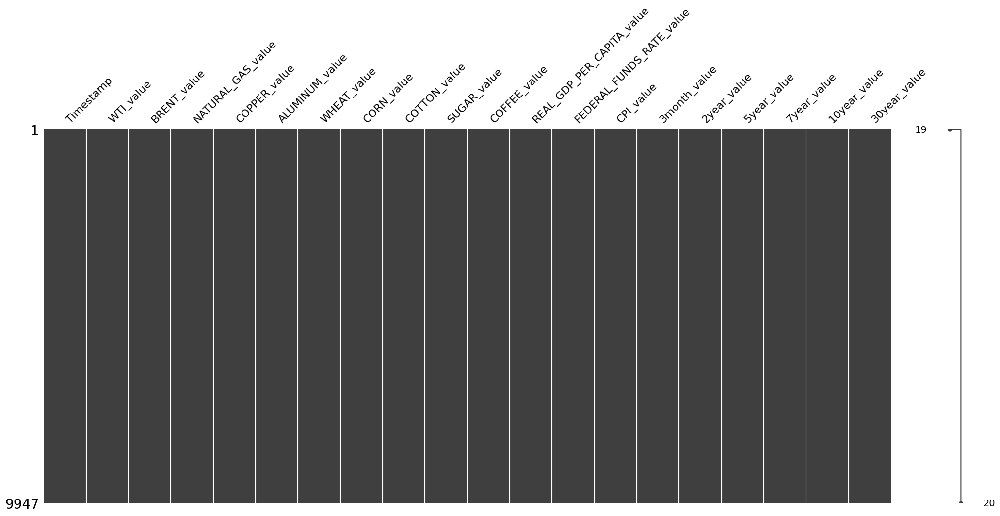

In [25]:
msno.matrix(filled_df_since_1997)

Realizando una última revisión de valores no nulos se observa que las cuatro primeras filas en la columna "BRENT_value" posee valores nulos.

In [26]:
filled_df_since_1997

,Timestamp,WTI_value,BRENT_value,NATURAL_GAS_value,COPPER_value,ALUMINUM_value,WHEAT_value,CORN_value,COTTON_value,SUGAR_value,COFFEE_value,REAL_GDP_PER_CAPITA_value,FEDERAL_FUNDS_RATE_value,CPI_value,3month_value,2year_value,5year_value,7year_value,10year_value,30year_value
0,2024-04-01,84.540000,NaN,1.640000,9445.590000,2499.230000,208.380000,190.900000,90.600000,20.650000,239.870000,68977.000000,5.33,313.550000,5.440,4.720000,4.3400,4.3300,4.3300,4.470000
1,2024-03-31,84.395000,NaN,1.615000,9421.307097,2490.527097,208.491613,190.878387,90.889032,20.686129,238.871290,68972.296703,5.33,313.510645,5.445,4.687500,4.3075,4.2975,4.2975,4.437500
2,2024-03-30,84.250000,NaN,1.590000,9397.024194,2481.824194,208.603226,190.856774,91.178065,20.722258,237.872581,68967.593407,5.33,313.471290,5.450,4.655000,4.2750,4.2650,4.2650,4.405000
3,2024-03-29,84.105000,NaN,1.565000,9372.741290,2473.121290,208.714839,190.835161,91.467097,20.758387,236.873871,68962.890110,5.33,313.431935,5.455,4.622500,4.2425,4.2325,4.2325,4.372500
4,2024-03-28,83.960000,86.17,1.540000,9348.458387,2464.418387,208.826452,190.813548,91.756129,20.794516,235.875161,68958.186813,5.33,313.392581,5.460,4.590000,4.2100,4.2000,4.2000,4.340000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9942,1997-01-11,25.833333,23.95,3.946667,2406.630000,1582.050000,164.170000,121.750000,80.400000,10.810000,166.330000,45203.000000,5.17,159.600000,5.140,6.063333,6.4000,6.5200,6.6300,6.856667
9943,1997-01-10,26.150000,24.22,3.920000,2406.630000,1582.050000,164.170000,121.750000,80.400000,10.810000,166.330000,45203.000000,5.17,159.600000,5.170,6.060000,6.4000,6.5200,6.6300,6.860000
9944,1997-01-09,26.300000,24.83,3.610000,2406.630000,1582.050000,164.170000,121.750000,80.400000,10.810000,166.330000,45203.000000,5.25,159.600000,5.130,5.940000,6.2700,6.4100,6.5200,6.760000
9945,1997-01-08,26.550000,24.78,3.800000,2406.630000,1582.050000,164.170000,121.750000,80.400000,10.810000,166.330000,45203.000000,5.20,159.600000,5.160,6.010000,6.3400,6.4900,6.6000,6.830000


Se decide eliminar las cuatro primeras filas del dataset para lidiar con los valores nulos encontrados.

In [27]:

filled_df_since_1997 = filled_df_since_1997.iloc[4:]
filled_df_since_1997.reset_index(drop=True, inplace=True)


Se verifica si siguen existiendo valores nulos. Se observa que ya no existen valores nulos en ninguna de las columnas.

In [28]:

print(filled_df_since_1997.isnull().values.any())
print(filled_df_since_1997.isnull().sum())


False
Timestamp                    0
WTI_value                    0
BRENT_value                  0
NATURAL_GAS_value            0
COPPER_value                 0
ALUMINUM_value               0
WHEAT_value                  0
CORN_value                   0
COTTON_value                 0
SUGAR_value                  0
COFFEE_value                 0
REAL_GDP_PER_CAPITA_value    0
FEDERAL_FUNDS_RATE_value     0
CPI_value                    0
3month_value                 0
2year_value                  0
5year_value                  0
7year_value                  0
10year_value                 0
30year_value                 0
dtype: int64


###Manejo de outliers

Antes de tomar una decisión de como lidiar con los outliers, se desea observar las curvas resultantes luego de haber tratado con los valores no nulos. El siguiente código crea un arreglo de tres columnas donde grafica cada una de las columnas numéricas con un gráfico de líneas.

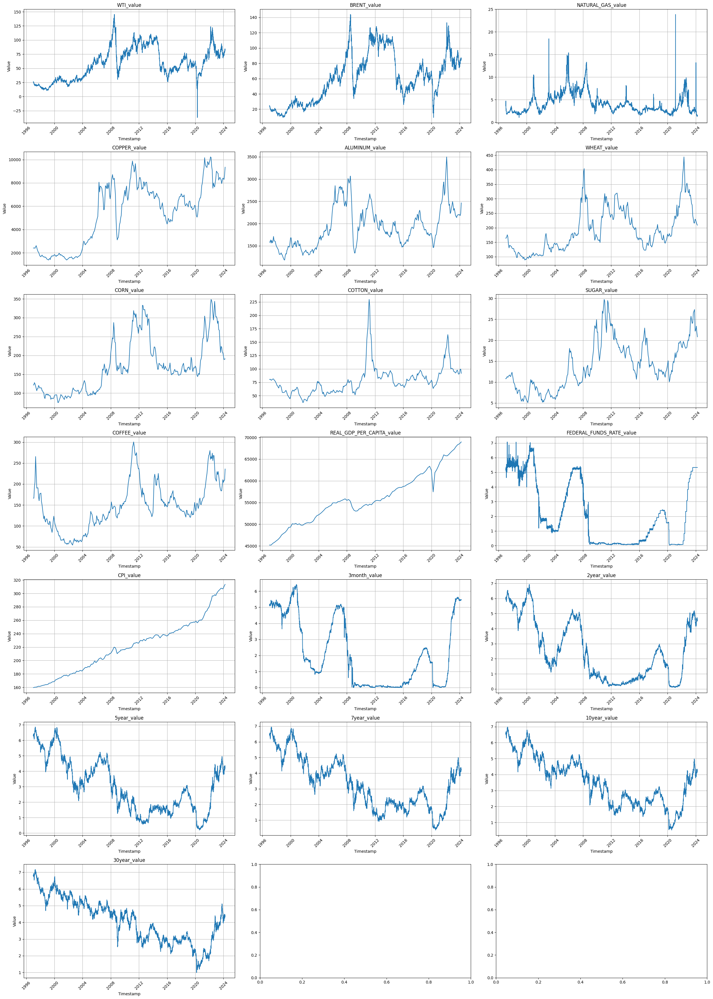

In [29]:
# Select only the float columns
float_columns = filled_df_since_1997.select_dtypes(include=['float64'])

# Create a figure and axes with 3 columns
fig, axes = plt.subplots(nrows=len(float_columns.columns) // 3 + (len(float_columns.columns) % 3 > 0), ncols=3, figsize=(25, 5 * (len(float_columns.columns) // 3 + (len(float_columns.columns) % 3 > 0))))

# Iterate through the float columns and plot each one in a separate subplot
for i, column in enumerate(float_columns.columns):
  row = i // 3
  col = i % 3
  axes[row, col].plot(filled_df_since_1997['Timestamp'], float_columns[column])
  axes[row, col].set_title(column)
  axes[row, col].set_xlabel('Timestamp')
  axes[row, col].set_ylabel('Value')
  axes[row, col].grid(True)
  axes[row, col].tick_params(axis='x', rotation=45)


# Adjust the layout and display the plots
plt.tight_layout()
plt.show()


Como se observa en los gráficos generados se observa que a lo largo del tiempo existen subidas o bajadas drásticas de algunos valores, por ejemplo se observa que la columna REAL_GDP_PER_CAPITA_value el año 2020 presenta la bajada más abrupta de en su valor en todo el horizonte de tiempo, sin embargo este valor representa de todas formas un corportamiento realista ya que coincide con el año de la pandemia del COVID 19, donde el cambio repentino al encierro en hogares y trabajos remotos afectó momentáneamente a toda la economía del mundo.

Ya que todos los valores a analizar corresponden a datos de serie de tiempo el utilizar criterios de identificación de outliers como la cración de un boxplot o calcular el Z score podría no ser preciso ya que de esta forma puede que los cambios abrupos no sean considerados como outliers.

Es por esto que para un análisis mas preciso de outliers se crea una copia del dataframe con los cambios de valores, la identificación de los valores atipicos se llevará a cabo utilizando estos datos calculados. El siguiente fragmento de código crea el dataframe de cambios de las variables.

In [30]:
# Crear una copia del dataset
rate_of_change_df = filled_df_since_1997.copy()

# Convertir la columna 'Timestamp' en el índice del DataFrame si no lo es ya
rate_of_change_df.set_index('Timestamp', inplace=True)

# Calcular la diferencia absoluta día a día
for column in rate_of_change_df.columns:
    rate_of_change_df[column] = rate_of_change_df[column] - rate_of_change_df[column].shift(1)

# Reemplazar los valores NaN por ceros
rate_of_change_df = rate_of_change_df.fillna(0)

rate_of_change_df


,WTI_value,BRENT_value,NATURAL_GAS_value,COPPER_value,ALUMINUM_value,WHEAT_value,CORN_value,COTTON_value,SUGAR_value,COFFEE_value,REAL_GDP_PER_CAPITA_value,FEDERAL_FUNDS_RATE_value,CPI_value,3month_value,2year_value,5year_value,7year_value,10year_value,30year_value
Timestamp,,,,,,,,,,,,,,,,,,,
2024-03-28,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00,0.000000,0.00,0.000000,0.00,0.00,0.00,0.000000
2024-03-27,-1.810000,-1.230000,-0.110000,-24.282903,-8.702903,0.111613,-0.021613,0.289032,0.036129,-0.99871,-4.703297,0.00,-0.039355,-0.01,-0.050000,-0.03,-0.02,0.00,0.020000
2024-03-26,0.260000,0.970000,0.050000,-24.282903,-8.702903,0.111613,-0.021613,0.289032,0.036129,-0.99871,-4.703297,0.00,-0.039355,0.01,0.020000,0.04,0.05,0.04,0.040000
2024-03-25,0.000000,0.270000,-0.020000,-24.282903,-8.702903,0.111613,-0.021613,0.289032,0.036129,-0.99871,-4.703297,0.00,-0.039355,0.00,-0.020000,0.01,0.02,0.01,0.020000
2024-03-24,-0.436667,-0.436667,0.013333,-24.282903,-8.702903,0.111613,-0.021613,0.289032,0.036129,-0.99871,-4.703297,0.00,-0.039355,0.00,0.016667,-0.01,-0.01,-0.01,-0.010000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1997-01-11,0.316667,0.270000,-0.026667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00,0.000000,0.03,-0.003333,0.00,0.00,0.00,0.003333
1997-01-10,0.316667,0.270000,-0.026667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00,0.000000,0.03,-0.003333,0.00,0.00,0.00,0.003333
1997-01-09,0.150000,0.610000,-0.310000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.08,0.000000,-0.04,-0.120000,-0.13,-0.11,-0.11,-0.100000


Para tener una idea general del nuevo dataframe creado se vuelve a crear el arreglo de gráficos de 3 columnas para este dataframe en el cual se puede observar de manera más evidente los cambios abruptos en los valores de las columnas.

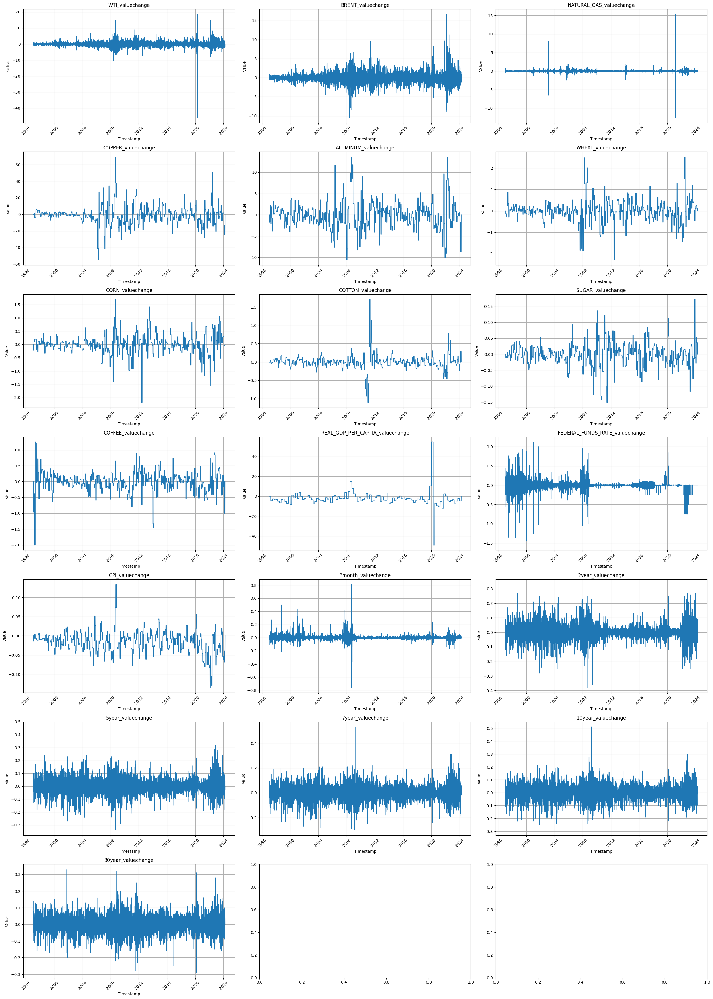

In [31]:
# Select only the float columns
float_columns = rate_of_change_df.select_dtypes(include=['float64'])

# Create a figure and axes with 3 columns
fig, axes = plt.subplots(nrows=len(float_columns.columns) // 3 + (len(float_columns.columns) % 3 > 0), ncols=3, figsize=(25, 5 * (len(float_columns.columns) // 3 + (len(float_columns.columns) % 3 > 0))))

# Iterate through the float columns and plot each one in a separate subplot
for i, column in enumerate(float_columns.columns):
  row = i // 3
  col = i % 3
  axes[row, col].plot(rate_of_change_df.index, float_columns[column])
  axes[row, col].set_title(column + "change")
  axes[row, col].set_xlabel('Timestamp')
  axes[row, col].set_ylabel('Value')
  axes[row, col].grid(True)
  axes[row, col].tick_params(axis='x', rotation=45)


# Adjust the layout and display the plots
plt.tight_layout()
plt.show()


Con este nuevo dataset creado se utiliza z score para la identificación de outliers. Normalmente para la identificación de outliers se suele utilizar el criterio que todos los valores con un z score mayor a 3 son considerados outliers. Sin embargo realizando inspección visual posterior se observa que de esta manera varios valores son considerados falsamente como valores atipicos. Es por esto que se decide aplicar un criterio mas drástico en cuanto al z score, considerando un z score sobre 6 para la identificación de outliers.

Este valor se determinó en forma empírica probando diferentes valores de umbral para el z score y posterior inspección visual.

El siguiente fragmento de código crea un nuevo dataset llamado outliers_df, que consiste en un dataset con la misma cantidad de filas y columnas que rate_of_change_df pero los valores que contienen son valores booleanos que indican si el respectivo dato para determinado Timestamp corresponde a un outlier o no.

In [32]:
# Function to detect outliers using Z-score
def detect_outliers_zscore(data, threshold=6):
  z_scores = np.abs((data - data.mean()) / data.std())
  return z_scores > threshold

# Detect outliers in each numerical column of rate_of_change_df using Z-score
outliers_df = rate_of_change_df.select_dtypes(include=np.number).apply(detect_outliers_zscore)

# Display the outliers for each column
print(outliers_df)


            WTI_value  BRENT_value  NATURAL_GAS_value  COPPER_value  \
Timestamp                                                             
2024-03-28      False        False              False         False   
2024-03-27      False        False              False         False   
2024-03-26      False        False              False         False   
2024-03-25      False        False              False         False   
2024-03-24      False        False              False         False   
...               ...          ...                ...           ...   
1997-01-11      False        False              False         False   
1997-01-10      False        False              False         False   
1997-01-09      False        False              False         False   
1997-01-08      False        False              False         False   
1997-01-07      False        False              False         False   

            ALUMINUM_value  WHEAT_value  CORN_value  COTTON_value  \
Timesta

Con los outliers ya identificados se vuelve a general el arreglo de tres columnas del dataframe rate_of_change_df marcando los valores de outliers identificados.

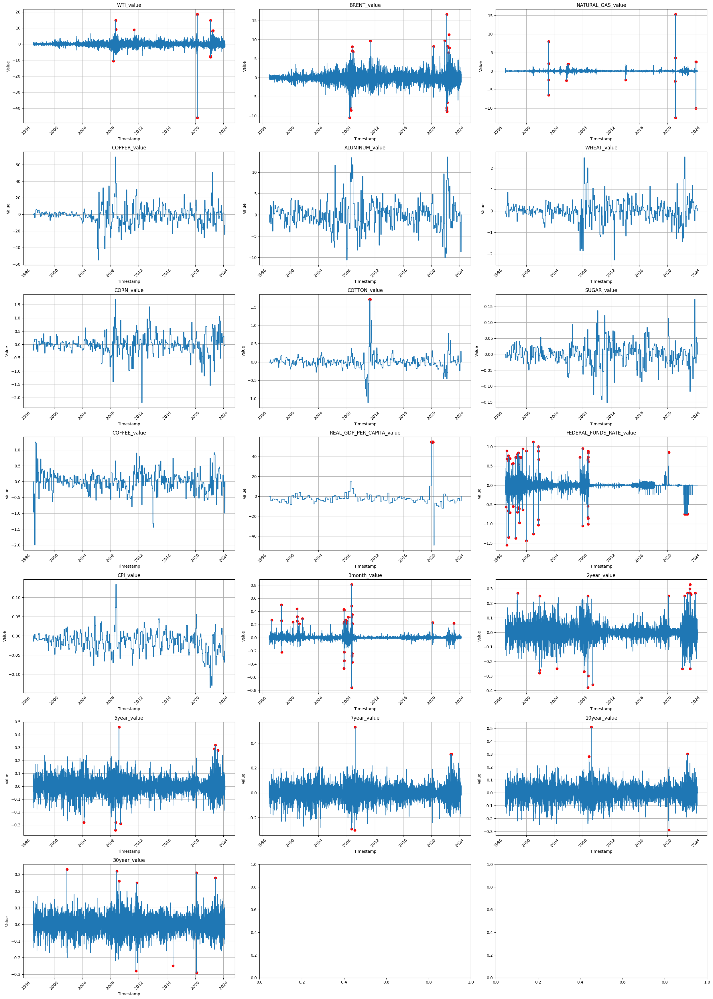

In [33]:
# Select only the float columns
float_columns = rate_of_change_df.select_dtypes(include=['float64'])

# Create a figure and axes with 3 columns
fig, axes = plt.subplots(nrows=len(float_columns.columns) // 3 + (len(float_columns.columns) % 3 > 0), ncols=3, figsize=(25, 5 * (len(float_columns.columns) // 3 + (len(float_columns.columns) % 3 > 0))))

# Iterate through the float columns and plot each one in a separate subplot
for i, column in enumerate(float_columns.columns):
  row = i // 3
  col = i % 3
  axes[row, col].plot(rate_of_change_df.index, float_columns[column]) # Use rate_of_change_df.index for x-axis
  axes[row, col].set_title(column)
  axes[row, col].set_xlabel('Timestamp')
  axes[row, col].set_ylabel('Value')
  axes[row, col].grid(True)
  axes[row, col].tick_params(axis='x', rotation=45)

  # Mark outliers using .loc for label-based indexing
  outliers_indices = outliers_df[column][outliers_df[column]].index
  for outlier_index in outliers_indices:
    # Use .loc to access data by index label (outlier_index)
    axes[row, col].scatter(outlier_index, float_columns[column].loc[outlier_index], color='red', marker='o')

# Adjust the layout and display the plots
plt.tight_layout()
plt.show()


Ahora se desean observar los outliers en el set de datos con los valores abosulutos en vez de las razones de cambio, es decir, graficar los valores del dataset filled_df_since_1997 marcando los valores de outliers de outliers_df.

Para que esto sea posible es necesario hacer que ambos dataframes tengan un formato consistente, ya que outliers_df tiene los Timestamps como índices y filled_df_since_1997 como valores de una columna.

El siguiente fragmento de código crea una copia de filled_df_since_1997 llamada df_with_timestamp_index donde los valores de la columna Timestamp son transformadas en índice.

In [34]:
# Create a copy of the DataFrame
df_with_timestamp_index = filled_df_since_1997.copy()

# Set the 'Timestamp' column as the index
df_with_timestamp_index.set_index('Timestamp', inplace=True)

# Now, 'Timestamp' is the index of the DataFrame
print(df_with_timestamp_index.head())


            WTI_value  BRENT_value  NATURAL_GAS_value  COPPER_value  \
Timestamp                                                             
2024-03-28  83.960000    86.170000           1.540000   9348.458387   
2024-03-27  82.150000    84.940000           1.430000   9324.175484   
2024-03-26  82.410000    85.910000           1.480000   9299.892581   
2024-03-25  82.410000    86.180000           1.460000   9275.609677   
2024-03-24  81.973333    85.743333           1.473333   9251.326774   

            ALUMINUM_value  WHEAT_value  CORN_value  COTTON_value  \
Timestamp                                                           
2024-03-28     2464.418387   208.826452  190.813548     91.756129   
2024-03-27     2455.715484   208.938065  190.791935     92.045161   
2024-03-26     2447.012581   209.049677  190.770323     92.334194   
2024-03-25     2438.309677   209.161290  190.748710     92.623226   
2024-03-24     2429.606774   209.272903  190.727097     92.912258   

            SUGAR_

Luego de adaptar los formatos se procede a crear un nuevo arreglo de gráfico de tres columnas que contiene los valores del dataset con los valores absolutos (en vez de cambio) con sus respectivos outliers identificados.

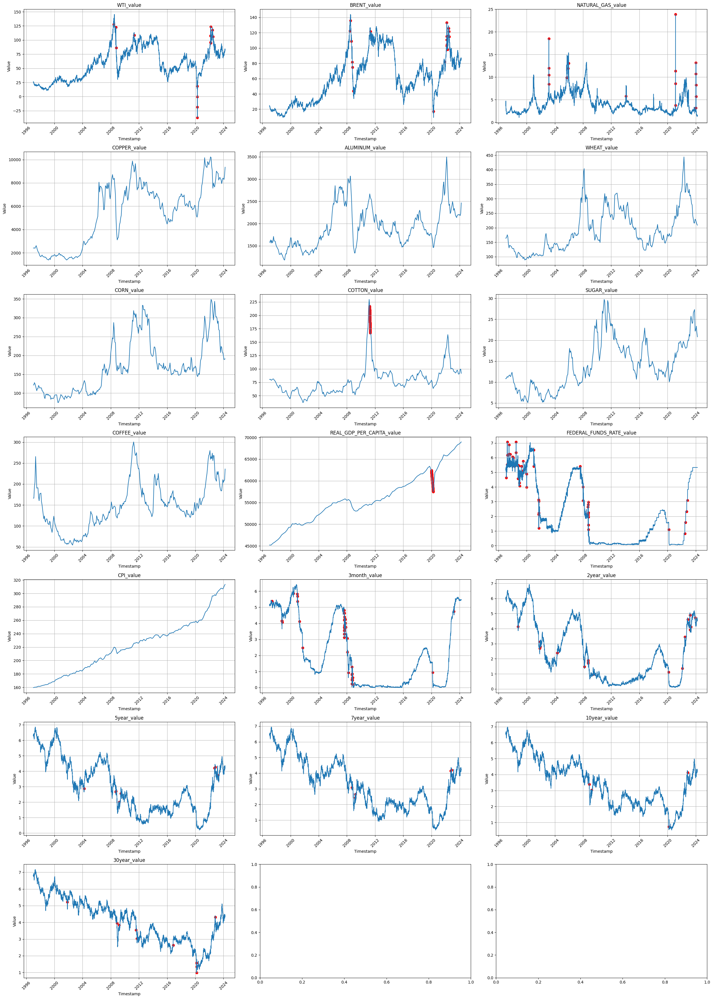

In [35]:
# Select only the float columns
float_columns = df_with_timestamp_index.select_dtypes(include=['float64'])

# Create a figure and axes with 3 columns
fig, axes = plt.subplots(nrows=len(float_columns.columns) // 3 + (len(float_columns.columns) % 3 > 0), ncols=3, figsize=(25, 5 * (len(float_columns.columns) // 3 + (len(float_columns.columns) % 3 > 0))))

# Iterate through the float columns and plot each one in a separate subplot
for i, column in enumerate(float_columns.columns):
  row = i // 3
  col = i % 3
  axes[row, col].plot(filled_df_since_1997["Timestamp"], float_columns[column]) # Use rate_of_change_df.index for x-axis
  axes[row, col].set_title(column)
  axes[row, col].set_xlabel('Timestamp')
  axes[row, col].set_ylabel('Value')
  axes[row, col].grid(True)
  axes[row, col].tick_params(axis='x', rotation=45)

  # Mark outliers using .loc for label-based indexing
  outliers_indices = outliers_df[column][outliers_df[column]].index
  for outlier_index in outliers_indices:
    # Use .loc to access data by index label (outlier_index)
    axes[row, col].scatter(outlier_index, float_columns[column].loc[outlier_index], color='red', marker='o')

# Adjust the layout and display the plots
plt.tight_layout()
plt.show()


Para lidiar con los outliers identificados se decide reemplazar estos valores por un valor nulo y luego realizar imputación de valores nulos utilizando interpolación. De esta manera se suavizan los gráficos eliminando los "peaks" repentinos que experimentan los valores.

El siguiente fragmento de código realiza el reemplazo de outliers según lo señalado.

In [36]:
# Create a copy of the DataFrame
df_no_outliers = df_with_timestamp_index.copy()

# Iterate through the float columns and replace outliers with NaN
for column in df_no_outliers.select_dtypes(include=['float64']).columns:
    outlier_indices = outliers_df[column][outliers_df[column]].index
    # Reemplazar los outliers por NaN
    df_no_outliers.loc[outlier_indices, column] = float('nan')

# Usar interpolación para rellenar los NaN generados por los outliers
df_no_outliers.interpolate(method='linear', inplace=True)

# Ahora, df_no_outliers contiene el DataFrame con outliers convertidos en NaN y luego interpolados


Con los outliers ya sustituidos se construye nuevamente el arreglo de gráficos de tres columnas, donde se observa en algunos gráficos que ya no existen "peaks" repentinos en los datos y en otro gráficos se observa que estos cambios repentinos siguen presentes pero en forma mitigada. Un ejemplo del segundo caso se observa en el gráfico de NATURAL_GAS_value.

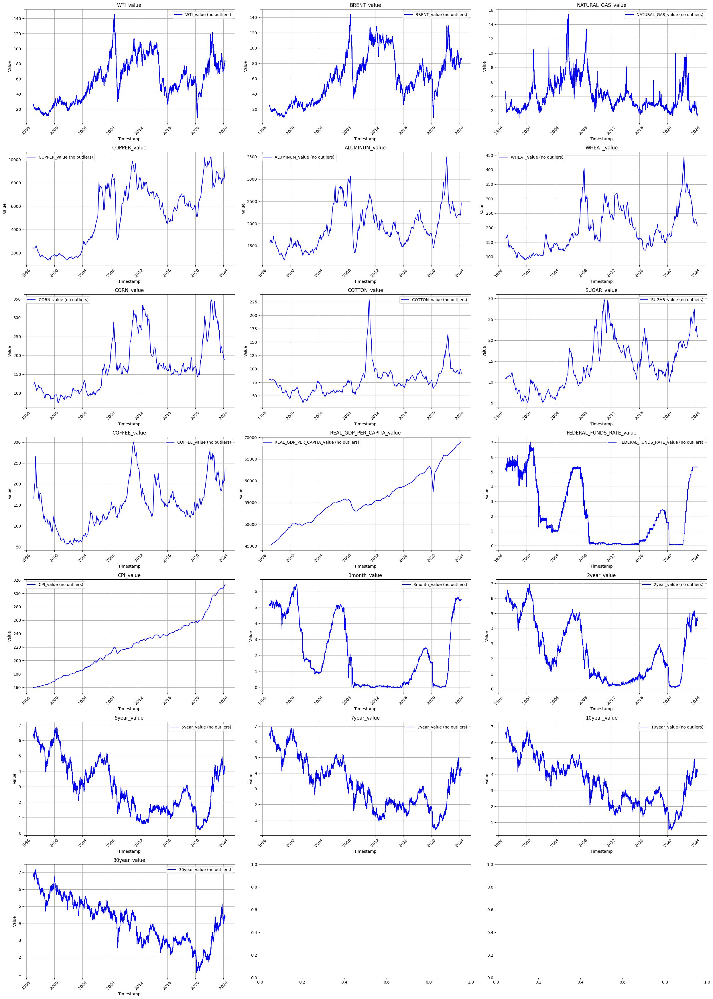

In [37]:
# Select only the float columns from both DataFrames
float_columns = df_no_outliers.select_dtypes(include=['float64'])
float_columns_with_index = df_with_timestamp_index[float_columns.columns]  # Ensure same columns are selected

# Create a figure and axes with 3 columns
fig, axes = plt.subplots(nrows=len(float_columns.columns) // 3 + (len(float_columns.columns) % 3 > 0),
                         ncols=3,
                         figsize=(25, 5 * (len(float_columns.columns) // 3 + (len(float_columns.columns) % 3 > 0))))

# Iterate through the float columns and plot each one in a separate subplot
for i, column in enumerate(float_columns.columns):
    row = i // 3
    col = i % 3
    # Plot data from df_no_outliers
    axes[row, col].plot(df_no_outliers.index, float_columns[column], label=f'{column} (no outliers)', color='blue')

    # Plot data from df_with_timestamp_index
   #axes[row, col].plot(df_with_timestamp_index.index, float_columns_with_index[column], label=f'{column} (with index)', color='orange')

    # Add titles and labels
    axes[row, col].set_title(column)
    axes[row, col].set_xlabel('Timestamp')
    axes[row, col].set_ylabel('Value')
    axes[row, col].grid(True)
    axes[row, col].tick_params(axis='x', rotation=45)
    axes[row, col].legend()  # Add legend to differentiate between datasets

# Adjust the layout and display the plots
plt.tight_layout()
plt.show()


Finalmente se crea la variable cleaned_df que contiene el resultado final del tratamiento de valores nulos y outliers. A partir de este se realizará el análisis exploratorio de datos.

In [38]:
cleaned_df = df_no_outliers

##Analisis exploratorio de datos

###Preguntas de Interés

Para el análisis explotatorio de datos a realizar se plantean las siguientes preguntas a ser respondidas.



*   ¿Existen commodities que sus precios sigan tendencias similares?
*   ¿Qué variables macroeconómicas están relacionadas entre ellas?
*   ¿Como se relaciona el comportamiento de las variables macroeconómicas con el precio de los commodities?



### Correlación de las variables del dataset

Una herramienta que es de gran ayuda como punto de partida para buscar relaciones entre las variables, es la matriz de correlación de las columnas del dataframe.

El siguiente fragmento de código constuye dicha matriz.

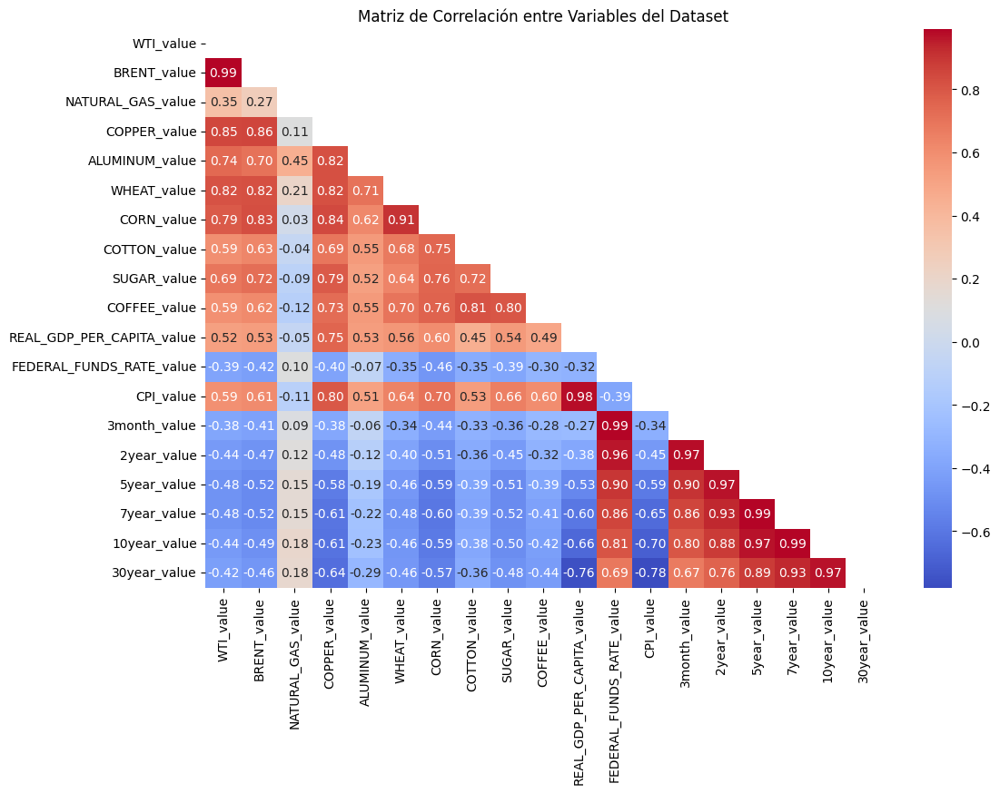

In [39]:
corr = cleaned_df.corr()
plt.figure(figsize=(12,8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', mask=np.triu(corr))
plt.title('Matriz de Correlación entre Variables del Dataset')
plt.show()

En base a la matriz de correlación se realizan las siguientes observaciones:


*   La columna FEDERAL_FUNDS_RATE_value tiene una correlación casi perfecta con la columna 3month_value (0,99). Esto tiene sentido porque la taza de política monetaria suele tener un efecto casi inmediato en el rendimiento de los bonos del tesoro de corto plazo. Con los bonos de plazos mas largos, es decir, las columnas 2year_value, 5year_value, 7year_value, 10year_value y 30year_value la correlación tiende a disminuir a mayor plazo tiene el bono (correlaciones de 0.96, 0.90, 0.86, 0.81 y 0.69 respectivamente)

* Las columnas REAL_DFP_PER_CAPITA_value y CPI_value están muy altamente correlacionadas

*   Los commodities que más correlacionados están son los de las columnas CORN_Value y WHEAT_value

* El precio de los commodities cobre, maíz y azucar (columnas COOPER_value, CORN_value y SUGAR_value) son los que más se correlaciones con las variables macroeconómicas, como los rendimientos de bonos de tesoro e índice del precio del consumidor.



### Evolución Histórica del Precio de Commodities

Ya teniendo una idea de cómo se correlacionan las variables se crean las primeras visualizaciones.

El siguiente fragmento de código crea cinco gráficos de líneas para comparar la evolución histórica de los precio de los siguientes pares de commodities:


* Petróleo WTI y Brent
* Cobre y aluminio
* Maíz y Trigo
* Algodón y café
* Azucar y gas natural

Los pares de valores a ser mostrados se eligieron de tal forma que los commodities que están altamente correlacionados se encuentren en el mismo gráfico.

En cada uno de los gráficos los valores se encuentran normalizados según sus valores mínimos y máximos históricos, esto permite una mejor visualización y comparación de las curvas ya que la normalización genera que todas las curvas se encuentren en la misma escala.

Además a cada uno de los gráficos se le añade la tendencia de valor promedio de todos los commodities analizados, para poder comparar como se relacionan los commodities individuales respecto al conjunto total de ellos.

De los cuatro primeros gráficos resultantes se puede observar la correlación entre las variables graficadas. Por ejemplo en el gráfico de precio del cobre y del aluminio se observa que cuando uno tiende a subir y que cuando uno tiende a bajar el otro también. Esto se puede observar fácilmente en todos los gráficos menos en el último, donde en este caso en particular no existe una correlación entre las variables.

Además, observando la tendencia de la curva promedio, se ve que posterior a periodos de crisis (por ejemplo 2008 y 2020) se observa una subida del promedio de los precios de los commodities. Esto tiene sentido ya que estos suelen ser usados como instrumentos para proteger valor en tiempos difíciles y de incertidumbre.



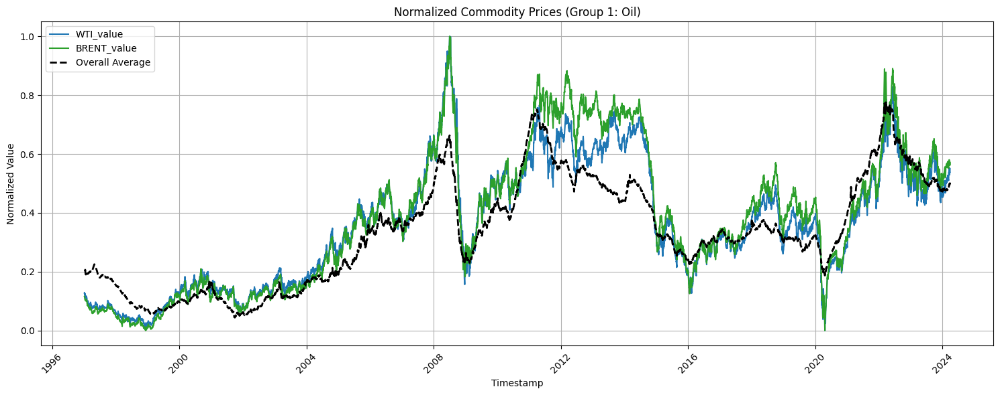

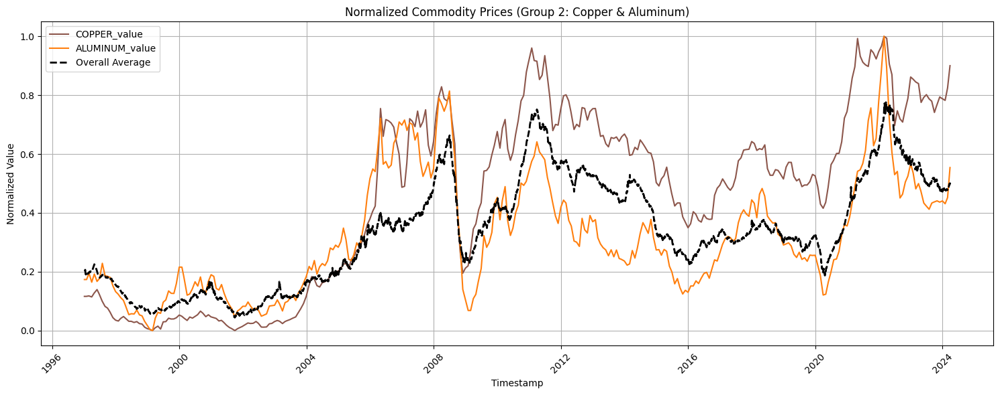

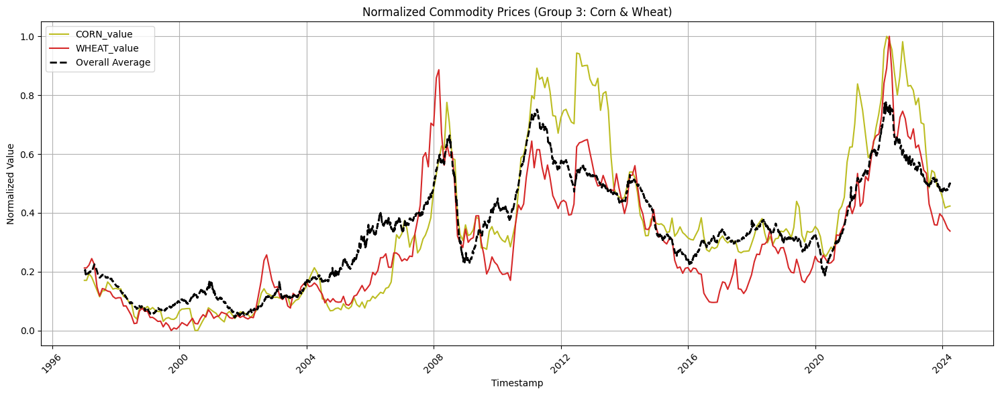

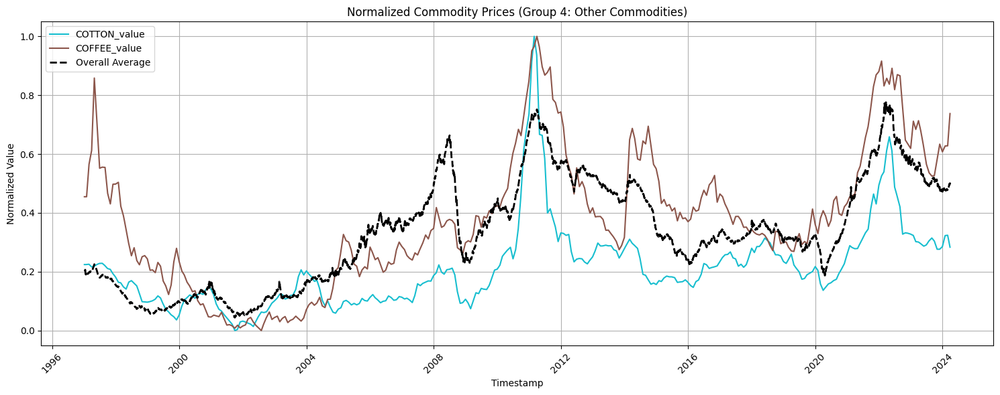

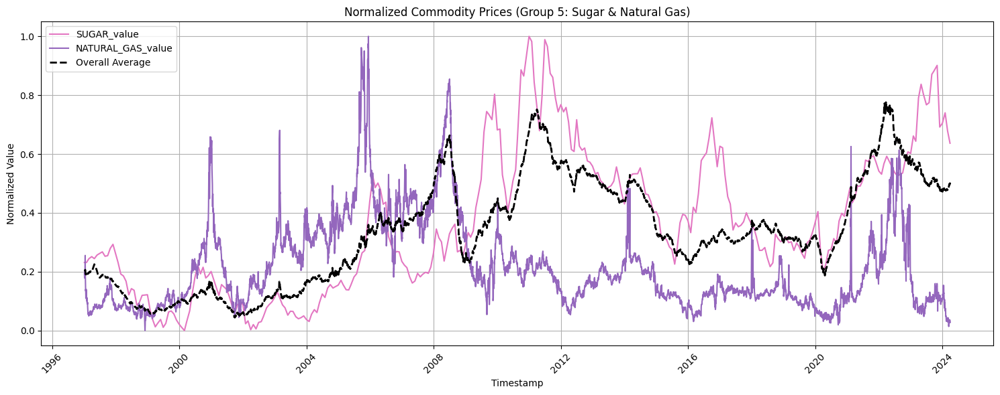

In [40]:
# Seleccionar las columnas que deseas normalizar y graficar (divididas en cinco grupos)
columns_group_1 = ['WTI_value', 'BRENT_value']  # Grupo 1: Petróleo WTI y Brent
columns_group_2 = ['COPPER_value', 'ALUMINUM_value']  # Grupo 2: Cobre y aluminio
columns_group_3 = ['CORN_value', 'WHEAT_value']  # Grupo 3: Maíz y trigo
columns_group_4 = ['COTTON_value', 'COFFEE_value']  # Grupo 4: Otros commodities
columns_group_5 = ['SUGAR_value', 'NATURAL_GAS_value']  # Grupo 5: Azúcar y gas natural

# Definir colores personalizados para cada commodity
commodity_colors = {
    'WTI_value': '#1f77b4',      # Azul para WTI
    'BRENT_value': '#2ca02c',    # Verde para Brent
    'COPPER_value': '#8c564b',   # Marrón para cobre
    'ALUMINUM_value': '#ff7f0e',  # Naranja para aluminio
    'CORN_value': '#bcbd22',     # Amarillo para maíz
    'WHEAT_value': '#d62728',    # Rojo para trigo
    'COTTON_value': '#17becf',   # Azul claro para algodón
    'COFFEE_value': '#8c564b',   # Marrón oscuro para café
    'SUGAR_value': '#e377c2',     # Rosa para azúcar
    'NATURAL_GAS_value': '#9467bd' # Púrpura para gas natural
}

# Normalizar las columnas entre 0 y 1
normalized_df = cleaned_df.copy()

for column in columns_group_1 + columns_group_2 + columns_group_3 + columns_group_4 + columns_group_5:
    min_val = cleaned_df[column].min()
    max_val = cleaned_df[column].max()
    normalized_df[column] = (cleaned_df[column] - min_val) / (max_val - min_val)

# Calcular el promedio de todos los commodities
overall_average = normalized_df[columns_group_1 + columns_group_2 + columns_group_3 + columns_group_4 + columns_group_5].mean(axis=1)

# Función para graficar con el promedio
def plot_with_avg(ax, columns):
    # Graficar las líneas de cada commodity
    for column in columns:
        ax.plot(normalized_df.index, normalized_df[column], label=column, color=commodity_colors[column])

    # Graficar la línea promedio de todos los commodities
    ax.plot(normalized_df.index, overall_average, label='Overall Average', color='black', linestyle='--', linewidth=2)

# Crear la primera figura para el Grupo 1
plt.figure(figsize=(15, 6))
plot_with_avg(plt.gca(), columns_group_1)
plt.xlabel('Timestamp')
plt.ylabel('Normalized Value')
plt.title('Normalized Commodity Prices (Group 1: Oil)')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# Crear la segunda figura para el Grupo 2
plt.figure(figsize=(15, 6))
plot_with_avg(plt.gca(), columns_group_2)
plt.xlabel('Timestamp')
plt.ylabel('Normalized Value')
plt.title('Normalized Commodity Prices (Group 2: Copper & Aluminum)')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# Crear la tercera figura para el Grupo 3
plt.figure(figsize=(15, 6))
plot_with_avg(plt.gca(), columns_group_3)
plt.xlabel('Timestamp')
plt.ylabel('Normalized Value')
plt.title('Normalized Commodity Prices (Group 3: Corn & Wheat)')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# Crear la cuarta figura para el Grupo 4 (Otros commodities)
plt.figure(figsize=(15, 6))
plot_with_avg(plt.gca(), columns_group_4)
plt.xlabel('Timestamp')
plt.ylabel('Normalized Value')
plt.title('Normalized Commodity Prices (Group 4: Other Commodities)')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# Crear la quinta figura para el Grupo 5 (Azúcar y Gas Natural)
plt.figure(figsize=(15, 6))
plot_with_avg(plt.gca(), columns_group_5)
plt.xlabel('Timestamp')
plt.ylabel('Normalized Value')
plt.title('Normalized Commodity Prices (Group 5: Sugar & Natural Gas)')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


El siguiente fragmento de código crea los mismos gráficos anteriores, pero en vez de utilizar los valores instantáneos muestra la media móvil de los valores.

Utilizando la media móvil se puede observar de forma mas clara la tendencia en las variables lo cual facilita el análisis realizado en los gráficos anteriores.

<ipython-input-41-583bc75875f2>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_moving_average = normalized_df[columns_group_1 + columns_group_2 + columns_group_3 + columns_group_4 + columns_group_5].resample('M').mean()


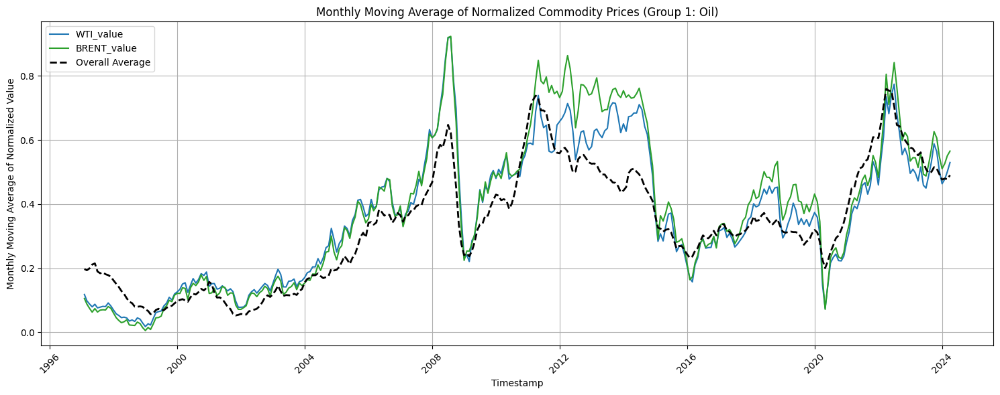

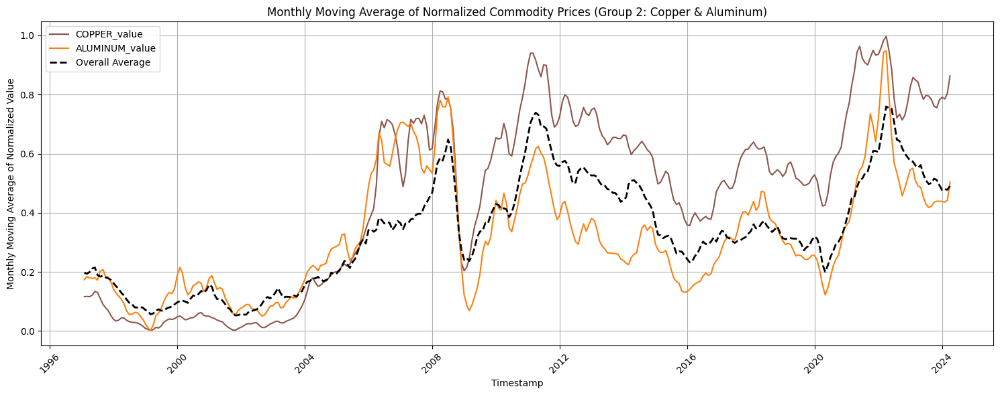

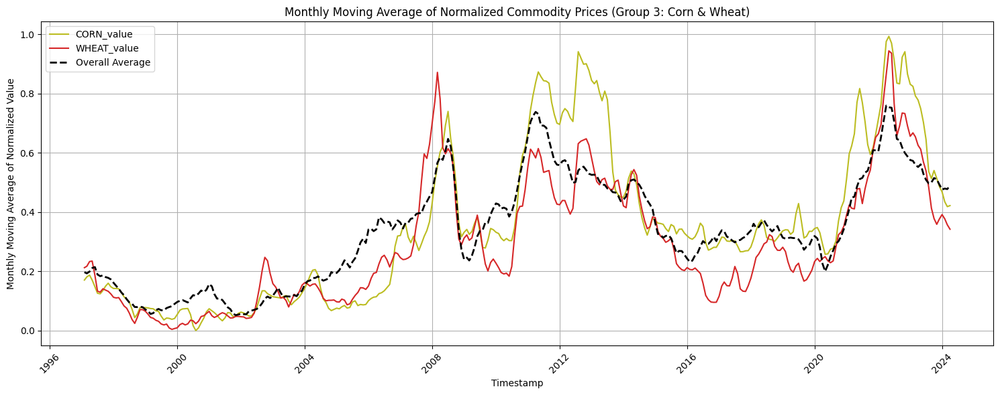

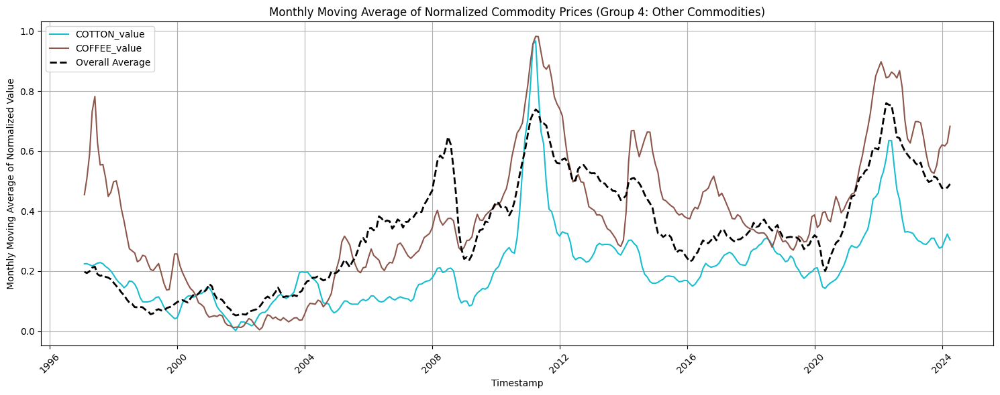

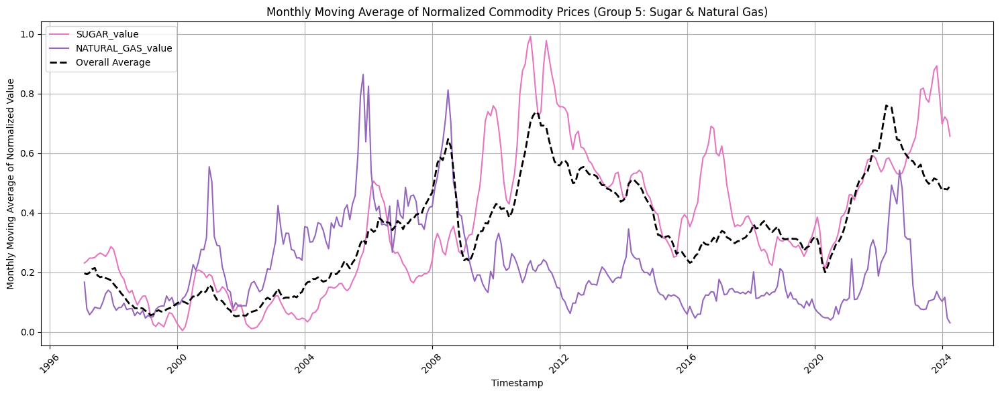

In [41]:
# Seleccionar las columnas que deseas normalizar y graficar (divididas en cinco grupos)
columns_group_1 = ['WTI_value', 'BRENT_value']  # Grupo 1: Petróleo WTI y Brent
columns_group_2 = ['COPPER_value', 'ALUMINUM_value']  # Grupo 2: Cobre y aluminio
columns_group_3 = ['CORN_value', 'WHEAT_value']  # Grupo 3: Maíz y trigo
columns_group_4 = ['COTTON_value', 'COFFEE_value']  # Grupo 4: Otros commodities
columns_group_5 = ['SUGAR_value', 'NATURAL_GAS_value']  # Grupo 5: Azúcar y gas natural

# Definir colores personalizados para cada commodity
commodity_colors = {
    'WTI_value': '#1f77b4',      # Azul para WTI
    'BRENT_value': '#2ca02c',    # Verde para Brent
    'COPPER_value': '#8c564b',   # Marrón para cobre
    'ALUMINUM_value': '#ff7f0e',  # Naranja para aluminio
    'CORN_value': '#bcbd22',     # Amarillo para maíz
    'WHEAT_value': '#d62728',    # Rojo para trigo
    'COTTON_value': '#17becf',   # Azul claro para algodón
    'COFFEE_value': '#8c564b',   # Marrón oscuro para café
    'SUGAR_value': '#e377c2',     # Rosa para azúcar
    'NATURAL_GAS_value': '#9467bd' # Púrpura para gas natural
}

# Normalizar las columnas entre 0 y 1
normalized_df = cleaned_df.copy()

for column in columns_group_1 + columns_group_2 + columns_group_3 + columns_group_4 + columns_group_5:
    min_val = cleaned_df[column].min()
    max_val = cleaned_df[column].max()
    normalized_df[column] = (cleaned_df[column] - min_val) / (max_val - min_val)

# Calcular el promedio móvil mensual
monthly_moving_average = normalized_df[columns_group_1 + columns_group_2 + columns_group_3 + columns_group_4 + columns_group_5].resample('M').mean()

# Función para graficar con el promedio móvil mensual
def plot_with_monthly_avg(ax, columns):
    # Graficar las líneas de cada commodity
    for column in columns:
        ax.plot(monthly_moving_average.index, monthly_moving_average[column], label=column, color=commodity_colors[column])

    # Graficar la línea promedio de todos los commodities
    overall_average = monthly_moving_average.mean(axis=1)
    ax.plot(monthly_moving_average.index, overall_average, label='Overall Average', color='black', linestyle='--', linewidth=2)

# Crear la primera figura para el Grupo 1
plt.figure(figsize=(15, 6))
plot_with_monthly_avg(plt.gca(), columns_group_1)
plt.xlabel('Timestamp')
plt.ylabel('Monthly Moving Average of Normalized Value')
plt.title('Monthly Moving Average of Normalized Commodity Prices (Group 1: Oil)')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# Crear la segunda figura para el Grupo 2
plt.figure(figsize=(15, 6))
plot_with_monthly_avg(plt.gca(), columns_group_2)
plt.xlabel('Timestamp')
plt.ylabel('Monthly Moving Average of Normalized Value')
plt.title('Monthly Moving Average of Normalized Commodity Prices (Group 2: Copper & Aluminum)')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# Crear la tercera figura para el Grupo 3
plt.figure(figsize=(15, 6))
plot_with_monthly_avg(plt.gca(), columns_group_3)
plt.xlabel('Timestamp')
plt.ylabel('Monthly Moving Average of Normalized Value')
plt.title('Monthly Moving Average of Normalized Commodity Prices (Group 3: Corn & Wheat)')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# Crear la cuarta figura para el Grupo 4 (Otros commodities)
plt.figure(figsize=(15, 6))
plot_with_monthly_avg(plt.gca(), columns_group_4)
plt.xlabel('Timestamp')
plt.ylabel('Monthly Moving Average of Normalized Value')
plt.title('Monthly Moving Average of Normalized Commodity Prices (Group 4: Other Commodities)')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# Crear la quinta figura para el Grupo 5 (Azúcar y Gas Natural)
plt.figure(figsize=(15, 6))
plot_with_monthly_avg(plt.gca(), columns_group_5)
plt.xlabel('Timestamp')
plt.ylabel('Monthly Moving Average of Normalized Value')
plt.title('Monthly Moving Average of Normalized Commodity Prices (Group 5: Sugar & Natural Gas)')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


### Análisis de Bonos del Tesoro y Taza de Política Monetaria

A continuación se desea realizar un análisis del comportamiento de los rendimientos de los bonos del tesoro de EE.UU en relación a la taza de política monetaria del mismo país.

El siguiente fragmento de código crea un gráfico de líneas con la taza de política monetaria y los rendimientos de los bonos del tesoro a todos los plazos analizados.

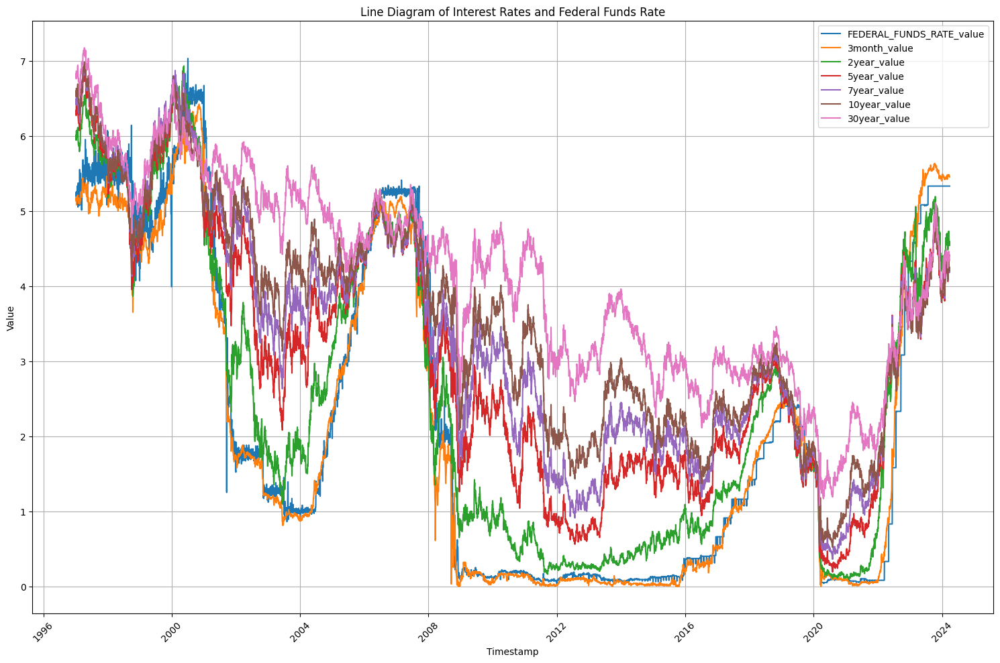

In [42]:
# Seleccionar las columnas que deseas graficar
columns_to_plot = ['FEDERAL_FUNDS_RATE_value', '3month_value', '2year_value', '5year_value', '7year_value', '10year_value', '30year_value']

# Crear una figura
plt.figure(figsize=(15, 10))

# Graficar cada columna
for column in columns_to_plot:
    plt.plot(cleaned_df.index, cleaned_df[column], label=column)

# Añadir etiquetas, título y leyenda
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.title('Line Diagram of Interest Rates and Federal Funds Rate')
plt.legend()

# Rotar las etiquetas del eje x para mejor legibilidad
plt.xticks(rotation=45)

# Mostrar la cuadrícula y el gráfico
plt.grid(True)
plt.tight_layout()
plt.show()


Debido a la variabilidad de los datos resulta dificultoso observar las tendencias, es por esto que se utiliza el siguiente código para observar las medias móviles de las curvas.

De la gáfica obtenida se observa que el rendimiento de los bonos del tesoro tienden a acercarse al valor de tasa de política monetaria, donde los bonos con menor plazo tienden a seguir a la taza de política monetaria de forma mas rápida que los bonos de mayor plazo.

<ipython-input-43-f0d30609f62e>:6: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_moving_average = cleaned_df[columns_to_plot].resample('M').mean()


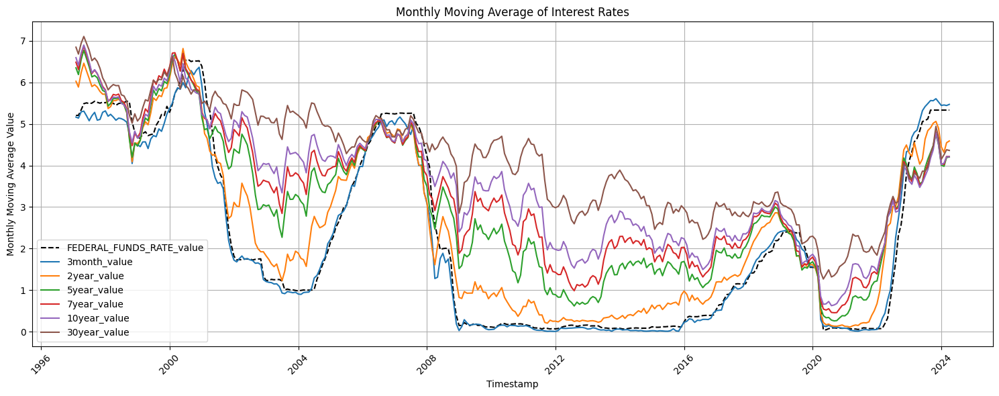

In [43]:
# Seleccionar las columnas que deseas graficar
columns_to_plot = ['FEDERAL_FUNDS_RATE_value', '3month_value', '2year_value',
                   '5year_value', '7year_value', '10year_value', '30year_value']

# Calcular el promedio móvil mensual
monthly_moving_average = cleaned_df[columns_to_plot].resample('M').mean()

# Crear el gráfico
plt.figure(figsize=(15, 6))

# Añadir FEDERAL_FUNDS_RATE_value en negro con línea discontinua
plt.plot(monthly_moving_average.index, monthly_moving_average['FEDERAL_FUNDS_RATE_value'],
         label='FEDERAL_FUNDS_RATE_value', color='black', linestyle='--')

# Añadir las otras columnas
for column in columns_to_plot[1:]:  # Excluir FEDERAL_FUNDS_RATE_value
    plt.plot(monthly_moving_average.index, monthly_moving_average[column], label=column)

# Añadir etiquetas, título y leyenda al gráfico
plt.xlabel('Timestamp')
plt.ylabel('Monthly Moving Average Value')
plt.title('Monthly Moving Average of Interest Rates')
plt.legend()

# Rotar las etiquetas del eje x para mejor legibilidad
plt.xticks(rotation=45)

# Mostrar la cuadrícula y el gráfico
plt.grid(True)
plt.tight_layout()
plt.show()


Para una mejor visualización del análisis anterior, se separa el gráfico en dos, donde se compara la taza de política monetaria con respecto a los bonos de corto plazo en el primer gráfico y con los bonos de largo plazo en el segundo gráfico.

<ipython-input-44-5600c2af54d7>:6: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_moving_average = cleaned_df[columns_group_1 + columns_group_2].resample('M').mean()


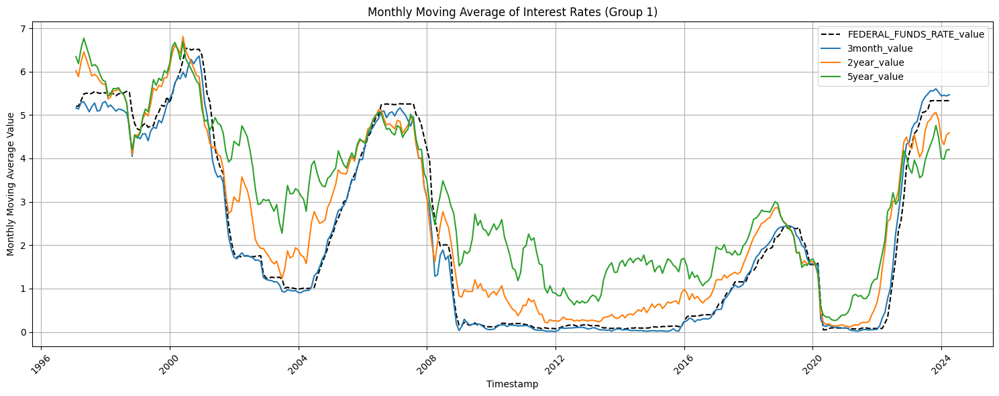

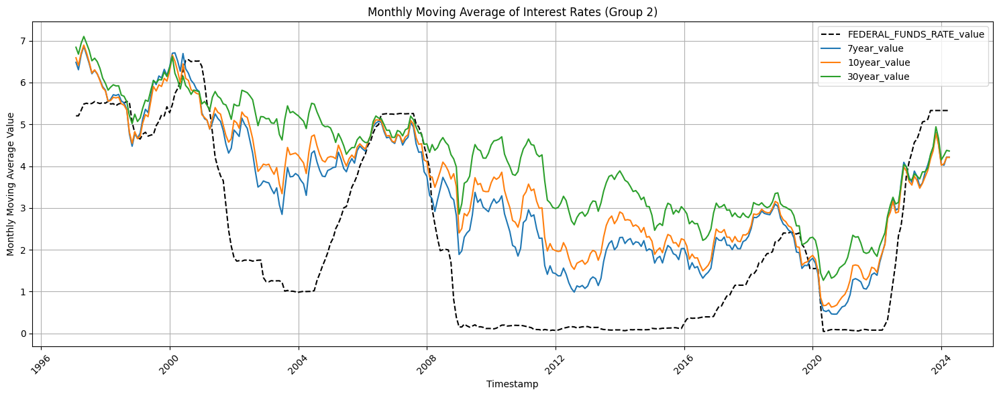

In [44]:
# Seleccionar las columnas que deseas graficar
columns_group_1 = ['FEDERAL_FUNDS_RATE_value', '3month_value', '2year_value','5year_value']  # Primer gráfico
columns_group_2 = ['7year_value', '10year_value', '30year_value']  # Segundo gráfico

# Calcular el promedio móvil mensual
monthly_moving_average = cleaned_df[columns_group_1 + columns_group_2].resample('M').mean()

# Crear el primer gráfico
plt.figure(figsize=(15, 6))
# Añadir FEDERAL_FUNDS_RATE_value en negro con línea discontinua
plt.plot(monthly_moving_average.index, monthly_moving_average['FEDERAL_FUNDS_RATE_value'], label='FEDERAL_FUNDS_RATE_value', color='black', linestyle='--')

for column in columns_group_1[1:]:  # Excluir FEDERAL_FUNDS_RATE_value
    plt.plot(monthly_moving_average.index, monthly_moving_average[column], label=column)

# Añadir etiquetas, título y leyenda al primer gráfico
plt.xlabel('Timestamp')
plt.ylabel('Monthly Moving Average Value')
plt.title('Monthly Moving Average of Interest Rates (Group 1)')
plt.legend()

# Rotar las etiquetas del eje x para mejor legibilidad
plt.xticks(rotation=45)

# Mostrar la cuadrícula y el primer gráfico
plt.grid(True)
plt.tight_layout()
plt.show()

# Crear el segundo gráfico
plt.figure(figsize=(15, 6))
# Añadir FEDERAL_FUNDS_RATE_value en negro con línea discontinua
plt.plot(monthly_moving_average.index, monthly_moving_average['FEDERAL_FUNDS_RATE_value'], label='FEDERAL_FUNDS_RATE_value', color='black', linestyle='--')

for column in columns_group_2:
    plt.plot(monthly_moving_average.index, monthly_moving_average[column], label=column)

# Añadir etiquetas, título y leyenda al segundo gráfico
plt.xlabel('Timestamp')
plt.ylabel('Monthly Moving Average Value')
plt.title('Monthly Moving Average of Interest Rates (Group 2)')
plt.legend()

# Rotar las etiquetas del eje x para mejor legibilidad
plt.xticks(rotation=45)

# Mostrar la cuadrícula y el segundo gráfico
plt.grid(True)
plt.tight_layout()
plt.show()


### Análisis de Precio del Cobre, Rendimiento Bonos del tesoro y PIB per Capita

En el gráfico generado en las siguientes líneas de código, el cual compara el comportamiento del precio del cobre, los bonos del tesoro a 30 años y el producto interno bruto per cápita, se observa que las caídas del PIB per capita suelen venir acompañadas de una caída en el precio del cobre. Además se observa que el precio del cobre suele variar en forma retardada y contraria al rendimiento de los bonos a 30 años. Es decir, que en varias ocaciones si disminuye el rendimiento de los bonos a 30 años tiende a aumentar el precio del cobre y viceversa. Esto último tiene sentido ya que un bajo precio en los bonos a largo plazo es un indicador de desconfianza de las perspectivas a largo plazo del país, lo cual genera un mayor interés a instrumentos de protección de valor como un commoditie como el cobre.

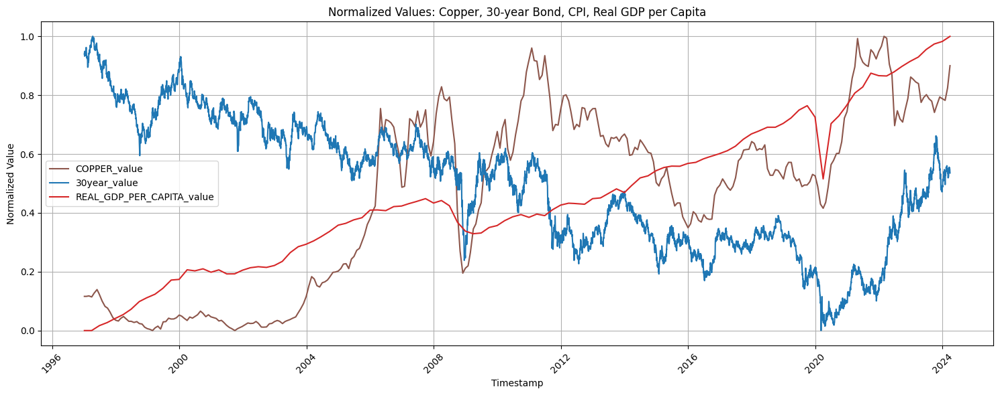

In [45]:
# Seleccionar las columnas que deseas graficar
columns_to_plot = ['COPPER_value', '30year_value', 'REAL_GDP_PER_CAPITA_value']

# Definir colores personalizados para cada serie
commodity_colors = {
    'COPPER_value': '#8c564b',  # Marrón para cobre
    '30year_value': '#1f77b4',  # Azul para 30-year bond
    'CPI_value': '#2ca02c',     # Verde para CPI (Índice de Precios al Consumidor)
    'REAL_GDP_PER_CAPITA_value': '#d62728'  # Rojo para PIB Real per cápita
}

# Normalizar las columnas seleccionadas entre 0 y 1
normalized_df = cleaned_df.copy()

for column in columns_to_plot:
    min_val = cleaned_df[column].min()
    max_val = cleaned_df[column].max()
    normalized_df[column] = (cleaned_df[column] - min_val) / (max_val - min_val)


# Función para graficar con el promedio
def plot_with_avg(ax, columns):
    # Graficar las líneas de cada columna
    for column in columns:
        ax.plot(normalized_df.index, normalized_df[column], label=column, color=commodity_colors[column])


# Crear el gráfico
plt.figure(figsize=(15, 6))
plot_with_avg(plt.gca(), columns_to_plot)
plt.xlabel('Timestamp')
plt.ylabel('Normalized Value')
plt.title('Normalized Values: Copper, 30-year Bond, CPI, Real GDP per Capita')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


En base al análisis exploratiorio de datos realizado se da respuesta a las preguntas de interés:

* ¿Existen commodities que sus precios sigan tendencias similares?

Sí, existen diferentes commodities que sus tendencias aumentan y disminuyen de forma similar, por ejemplo el cobre con el aluminio, el maíz y el trigo o el algodón y el café.

*   ¿Qué variables macroeconómicas están relacionadas entre ellas?

Los rendimientos de los bonos del tesoro de EE.UU tienden a seguir a la taza de política monetaria, entre menor es el plazo del bono más rápido se acerca a su valor.

*   ¿Como se relaciona el comportamiento de las variables macroeconómicas con el precio de los commodities?

ACTUALIZAR


##Feature Engineering, Feauture Selction

Hasta este punto todas las variables del dataframe corresponden a series de tiempo. Para simplificar la creación de un modelo de machine learning para realizar predicciones del comportamiento del precio del cobre es necesario transformar los valores del dataframe a valores que sean independientes de la estampa de tiempo. Para esto se decide transformar el dataset a uno que contenga el cambio porcentual mensual de las variables normalizadas.

Como primer paso se crea el dataframe *normalized_df* que corresponde a los valores del dataframe *cleaned_df* normalizado según sus respectivos valores mínimos y máximos.  Para esto se utiliza el siguiente fragmento de código:

In [46]:
# Normalizar las columnas entre 0 y 1
normalized_df = cleaned_df.copy()

for column in cleaned_df.columns:
  min_val = cleaned_df[column].min()
  max_val = cleaned_df[column].max()
  normalized_df[column] = (cleaned_df[column] - min_val) / (max_val - min_val)

# Imprimir el DataFrame normalizado
normalized_df

,WTI_value,BRENT_value,NATURAL_GAS_value,COPPER_value,ALUMINUM_value,WHEAT_value,CORN_value,COTTON_value,SUGAR_value,COFFEE_value,REAL_GDP_PER_CAPITA_value,FEDERAL_FUNDS_RATE_value,CPI_value,3month_value,2year_value,5year_value,7year_value,10year_value,30year_value
Timestamp,,,,,,,,,,,,,,,,,,,
2024-03-28,0.550220,0.571524,0.034170,0.900330,0.554045,0.338226,0.423308,0.283378,0.636805,0.737507,1.000000,0.756795,1.000000,0.850467,0.657895,0.602699,0.582701,0.569659,0.535558
2024-03-27,0.536950,0.562403,0.026499,0.897587,0.550291,0.338540,0.423229,0.284880,0.638272,0.733449,0.999802,0.756795,0.999744,0.848910,0.650585,0.598201,0.579666,0.569659,0.538840
2024-03-26,0.538856,0.569596,0.029986,0.894844,0.546537,0.338853,0.423150,0.286382,0.639739,0.729391,0.999604,0.756795,0.999488,0.850467,0.653509,0.604198,0.587253,0.575851,0.545405
2024-03-25,0.538856,0.571598,0.028591,0.892102,0.542784,0.339167,0.423071,0.287884,0.641206,0.725333,0.999406,0.756795,0.999232,0.850467,0.650585,0.605697,0.590288,0.577399,0.548687
2024-03-24,0.535655,0.568360,0.029521,0.889359,0.539030,0.339481,0.422992,0.289386,0.642673,0.721275,0.999208,0.756795,0.998976,0.850467,0.653021,0.604198,0.588771,0.575851,0.547046
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1997-01-11,0.124071,0.110122,0.201999,0.116253,0.173469,0.212649,0.170744,0.224370,0.231425,0.454941,0.000000,0.733906,0.000000,0.800623,0.873294,0.931034,0.934750,0.945820,0.948578
1997-01-10,0.126393,0.112125,0.200139,0.116253,0.173469,0.212649,0.170744,0.224370,0.231425,0.454941,0.000000,0.733906,0.000000,0.805296,0.872807,0.931034,0.934750,0.945820,0.949125
1997-01-09,0.127493,0.116648,0.178522,0.116253,0.173469,0.212649,0.170744,0.224370,0.231425,0.454941,0.000000,0.745351,0.000000,0.799065,0.855263,0.911544,0.918058,0.928793,0.932713


Como se observa en el resultado del siguiente código, ahora todas las columnas se encuentran con valores normalizados entre 0 y 1.

In [47]:
normalized_df.describe().T

,count,mean,std,min,25%,50%,75%,max
WTI_value,9943.0,0.362371,0.206033,0.0,0.172324,0.354399,0.518475,1.0
BRENT_value,9943.0,0.383742,0.234808,0.0,0.162180,0.375306,0.545186,1.0
NATURAL_GAS_value,9943.0,0.217359,0.152832,0.0,0.108787,0.170153,0.292887,1.0
COPPER_value,9943.0,0.456191,0.300261,0.0,0.123030,0.522653,0.701147,1.0
ALUMINUM_value,9943.0,0.319749,0.195447,0.0,0.164147,0.284664,0.439781,1.0
WHEAT_value,9943.0,0.288346,0.206450,0.0,0.123697,0.236302,0.424516,1.0
CORN_value,9943.0,0.352042,0.258772,0.0,0.116289,0.316770,0.493816,1.0
COTTON_value,9943.0,0.212423,0.140030,0.0,0.114126,0.189970,0.272350,1.0
SUGAR_value,9943.0,0.364358,0.235797,0.0,0.178339,0.315495,0.533090,1.0
COFFEE_value,9943.0,0.379202,0.228276,0.0,0.232325,0.363791,0.503640,1.0


Cuando se calcula la razón de cambio de alguna variable, es importante considerar que si alguno de los valores es cero pueden producirse una división por cero. Las siguientes líneas de código se utilizan para verificar cuántos ceros tiene el dataframe.

In [48]:
# Cuenta la cantidad de ceros en cada columna de normalized_df
zero_counts = (normalized_df == 0).sum()

# Imprime los resultados
print("Cantidad de ceros en cada columna:")
zero_counts

Cantidad de ceros en cada columna:


,0
WTI_value,1
BRENT_value,1
NATURAL_GAS_value,1
COPPER_value,1
ALUMINUM_value,1
WHEAT_value,1
CORN_value,1
COTTON_value,1
SUGAR_value,1
COFFEE_value,1


Como se puede observar la cantidad de ceros que posee el dataframe es un valor muy pequeño en relación a su tamaño. Por lo cual se decide reemplazar los ceros por el valor anterior. El siguiente fragmento de código realiza dicho reemplazo a los ceros y calcula la variación mensual porcentual de los valores de todas las columnas. El dataframe resultante es llamado *df_pct_change*

In [49]:
# Crear una copia del DataFrame para evitar modificar el original
df_pct_change = normalized_df.copy()

# Reemplazar ceros con el valor justo anterior
df_pct_change = df_pct_change.replace(0, np.nan).fillna(method='ffill')

# Iterar sobre las columnas numéricas y calcular el cambio porcentual mensual
for column in df_pct_change.select_dtypes(include=np.number).columns:
    df_pct_change[column] = df_pct_change[column].pct_change(periods=30) * 100  # Calcular cambio porcentual mensual y multiplicar por 100 para obtener porcentaje

# Eliminar la primera fila que contiene NaN debido al cálculo del cambio porcentual
df_pct_change = df_pct_change.dropna()

# Imprimir el DataFrame con los cambios porcentuales mensuales
df_pct_change.head(1000)


<ipython-input-49-87de6c9465ed>:5: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_pct_change = df_pct_change.replace(0, np.nan).fillna(method='ffill')


,WTI_value,BRENT_value,NATURAL_GAS_value,COPPER_value,ALUMINUM_value,WHEAT_value,CORN_value,COTTON_value,SUGAR_value,COFFEE_value,REAL_GDP_PER_CAPITA_value,FEDERAL_FUNDS_RATE_value,CPI_value,3month_value,2year_value,5year_value,7year_value,10year_value,30year_value
Timestamp,,,,,,,,,,,,,,,,,,,
2024-02-27,-5.542971,-3.075127,-4.081633,-8.728591,-18.695042,3.141983,-0.618523,14.269709,7.254911,-14.863006,-0.593971,0.000000,-0.825448,-0.183150,2.444444,2.736318,3.645833,2.989130,3.064351
2024-02-26,-4.942654,-1.226266,57.894737,-8.617999,-18.275524,3.258317,-0.638101,13.654083,7.352793,-14.394468,-0.594089,0.000000,-0.844917,0.366972,3.370787,2.756892,3.664921,2.173913,1.218274
2024-02-25,-5.700680,-2.399861,29.457364,-8.506730,-17.850244,3.374436,-0.657687,13.044915,7.450227,-13.920716,-0.594206,0.000000,-0.864397,0.122100,2.759135,1.654260,1.981051,0.896057,-0.300903
2024-02-24,-6.122449,-2.668223,25.203252,-8.394775,-17.419081,3.490340,-0.677281,12.442102,7.547215,-13.441664,-0.594324,0.000000,-0.883887,0.061050,3.071161,1.320132,1.113967,0.446828,-1.196411
2024-02-23,-5.985675,-2.039751,11.023622,-8.282131,-16.981913,3.606030,-0.696881,11.845546,7.643760,-12.957222,-0.594442,0.000000,-0.903387,0.000000,2.537313,1.488834,1.030928,0.537634,-1.200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-07,-4.754383,-5.244594,-26.053640,1.987627,-4.572088,-6.166751,7.731162,-5.323547,-5.596326,-8.042709,-1.014053,-66.666667,-1.013408,-60.000000,-46.153846,0.000000,20.547945,29.629630,35.907336
2021-06-06,-6.629578,-7.170339,-26.235741,2.029416,-4.456462,-5.677182,7.593249,-5.318175,-5.330660,-8.082679,-0.980596,-66.666667,-1.035553,-60.000000,-51.282051,-3.763441,13.852814,23.137255,26.714801
2021-06-05,-7.072413,-10.364914,-25.784967,2.071177,-4.340246,-5.181410,7.456286,-5.312782,-5.062760,-8.122851,-0.947098,-66.666667,-1.057705,-60.000000,-58.024691,-6.192358,11.252654,20.268972,24.666073


Como se observa en el resultado de la siguiente línea de código, se observa que en algunas variables el valor máximo es significativamente mayor que el valor del cuartil 3. Por lo tanto la transformación de los datos a valores de razón de cambio generó la creación de nuevos outliers.

In [50]:
df_pct_change.describe().T

,count,mean,std,min,25%,50%,75%,max
WTI_value,9913.0,1.206777,22.548082,-91.148073,-8.854668,-1.475677,7.669173,604.624277
BRENT_value,9913.0,10.063698,765.647898,-99.922118,-9.317949,-1.799056,8.222007,76150.000000
NATURAL_GAS_value,9913.0,4.781748,35.479747,-87.619048,-12.727273,0.063532,15.602837,830.769231
COPPER_value,9913.0,3.440758,70.299384,-98.684058,-5.806605,-0.843238,4.129347,3245.366569
ALUMINUM_value,9913.0,3.401692,62.732490,-99.742471,-8.222238,-0.721561,7.160153,4049.919477
WHEAT_value,9913.0,3.936514,101.657284,-96.774194,-7.634419,0.182649,7.840563,6090.095847
CORN_value,9913.0,63.132118,2392.984390,-96.774194,-6.915941,-0.098488,6.075090,154555.555556
COTTON_value,9913.0,7.761504,262.436006,-96.774194,-5.687207,-0.349640,5.692887,16824.324324
SUGAR_value,9913.0,3.638845,51.027723,-99.017043,-7.456633,-0.213395,7.210814,3018.279570
COFFEE_value,9913.0,2.291062,43.448861,-98.841467,-5.962491,0.379939,6.409156,3000.000000


El siguiente fragmento de código utiliza el criterio del rango intercuartil para determinar el rango de las variables en los cuales será considerado como rango normal, cualquier valor fuera de estos rangos será considerado como outlier.

In [51]:

def calculate_outlier_limits(df):
  outlier_limits = {}
  for column in df.select_dtypes(include=np.number).columns:
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    outlier_limits[column] = (round(lower_limit, 2), round(upper_limit, 2))

  return outlier_limits

outlier_limits = calculate_outlier_limits(df_pct_change)

for column, (lower_limit, upper_limit) in outlier_limits.items():
  print(f"Columna: {column}, Límite inferior: {lower_limit}, Límite superior: {upper_limit}")

Columna: WTI_value, Límite inferior: -33.64, Límite superior: 32.45
Columna: BRENT_value, Límite inferior: -35.63, Límite superior: 34.53
Columna: NATURAL_GAS_value, Límite inferior: -55.22, Límite superior: 58.1
Columna: COPPER_value, Límite inferior: -20.71, Límite superior: 19.03
Columna: ALUMINUM_value, Límite inferior: -31.3, Límite superior: 30.23
Columna: WHEAT_value, Límite inferior: -30.85, Límite superior: 31.05
Columna: CORN_value, Límite inferior: -26.4, Límite superior: 25.56
Columna: COTTON_value, Límite inferior: -22.76, Límite superior: 22.76
Columna: SUGAR_value, Límite inferior: -29.46, Límite superior: 29.21
Columna: COFFEE_value, Límite inferior: -24.52, Límite superior: 24.97
Columna: REAL_GDP_PER_CAPITA_value, Límite inferior: -3.33, Límite superior: 1.57
Columna: FEDERAL_FUNDS_RATE_value, Límite inferior: -15.88, Límite superior: 13.7
Columna: CPI_value, Límite inferior: -4.99, Límite superior: 2.88
Columna: 3month_value, Límite inferior: -23.85, Límite superior:

En base a los outliers identificados se realiza la eliminación estos utilizando el siguiente fragmento de código.

In [52]:
# Convertir outliers a NaN
for column in df_pct_change.select_dtypes(include=np.number).columns:
  lower_limit, upper_limit = outlier_limits[column]
  df_pct_change.loc[(df_pct_change[column] < lower_limit) | (df_pct_change[column] > upper_limit), column] = np.nan

# Reemplazar NaN con ffill
df_pct_change = df_pct_change.fillna(method='ffill')

<ipython-input-52-8cd26010ff71>:7: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_pct_change = df_pct_change.fillna(method='ffill')


Como se oberva a continuación, se han eliminado los outliers exitósamente y se observa que todos los valores máximos se encuentran dentro del rango intercuartil.

In [53]:
df_pct_change.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
WTI_value,9913.0,-0.12,12.97,-33.64,-8.86,-1.48,7.55,32.43
BRENT_value,9913.0,-0.24,13.99,-35.52,-9.22,-1.80,8.10,34.53
NATURAL_GAS_value,9913.0,2.00,23.07,-54.56,-12.73,0.00,15.43,58.09
COPPER_value,9913.0,-0.91,8.90,-20.69,-5.81,-0.84,4.13,19.03
ALUMINUM_value,9913.0,-0.00,12.22,-31.25,-8.22,-0.72,6.66,30.21
WHEAT_value,9913.0,0.50,13.39,-30.80,-7.63,0.18,7.84,31.04
CORN_value,9913.0,-0.46,11.17,-26.36,-7.15,-0.21,5.76,25.56
COTTON_value,9913.0,0.23,9.91,-22.75,-5.69,-0.35,5.69,22.76
SUGAR_value,9913.0,-0.04,12.64,-29.46,-7.46,-0.21,7.21,29.19
COFFEE_value,9913.0,0.25,10.48,-24.51,-5.96,0.38,6.41,24.95


Luego de tener el dataframe en el formato deseado se procede a eliminar columnas de este para simplificarlo. Las columnas seleccionadas para ser eliminadas han sido seleccionadas bajo los siguientes criterios:


*   Poca relación con el problema según análisis exploratorio de datos
*   Alta correlación entre variables independientes que puede generar redundancia en los datos.
*  Variables que en forma iterativa se ha descubierto que al ser eliminadas mejorar el desempeño del modelo de Machine Learning.



In [54]:
# Eliminar las columnas especificadas de df_pct_change
df_pct_change = df_pct_change.drop(columns=['WTI_value', 'NATURAL_GAS_value', '2year_value', '7year_value', '30year_value','FEDERAL_FUNDS_RATE_value'])

In [55]:
df_for_modeling = df_pct_change.copy()

## Creación, Entrenamiento y Testeo de Modelos de Machine Learning

In [56]:
df_for_modeling.head(1000)

,BRENT_value,COPPER_value,ALUMINUM_value,WHEAT_value,CORN_value,COTTON_value,SUGAR_value,COFFEE_value,REAL_GDP_PER_CAPITA_value,CPI_value,3month_value,5year_value,10year_value
Timestamp,,,,,,,,,,,,,
2024-02-27,-3.075127,-8.728591,-18.695042,3.141983,-0.618523,14.269709,7.254911,-14.863006,-0.593971,-0.825448,-0.183150,2.736318,2.989130
2024-02-26,-1.226266,-8.617999,-18.275524,3.258317,-0.638101,13.654083,7.352793,-14.394468,-0.594089,-0.844917,0.366972,2.756892,2.173913
2024-02-25,-2.399861,-8.506730,-17.850244,3.374436,-0.657687,13.044915,7.450227,-13.920716,-0.594206,-0.864397,0.122100,1.654260,0.896057
2024-02-24,-2.668223,-8.394775,-17.419081,3.490340,-0.677281,12.442102,7.547215,-13.441664,-0.594324,-0.883887,0.061050,1.320132,0.446828
2024-02-23,-2.039751,-8.282131,-16.981913,3.606030,-0.696881,11.845546,7.643760,-12.957222,-0.594442,-0.903387,0.000000,1.488834,0.537634
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-07,-5.244594,1.987627,-4.572088,-6.166751,7.731162,-5.323547,-5.596326,-8.042709,-1.014053,-1.013408,-20.000000,0.000000,15.294118
2021-06-06,-7.170339,2.029416,-4.456462,-5.677182,7.593249,-5.318175,-5.330660,-8.082679,-0.980596,-1.035553,-20.000000,-3.763441,15.294118
2021-06-05,-10.364914,2.071177,-4.340246,-5.181410,7.456286,-5.312782,-5.062760,-8.122851,-0.947098,-1.057705,-20.000000,-6.192358,20.268972


A continuación se dividen los datos en set de entrenamiento y testeo y se imprime los tamaños resultantes de los conjuntos divididos. Se decide destinar un 80% de los datos a entrenamiento y 20% a testeo. Además se crea una lista de modelos con 8 algoritmos de regresión con los cuales se creará un modelo y se comparará su desempeño.

In [57]:
# Importar librerías necesarias
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
import xgboost as xgb
import lightgbm as lgb


#
# Suponiendo que 'df_for_modeling' es tu DataFrame y 'COPPER_value' es la variable objetivo
X = df_for_modeling.drop('COPPER_value', axis=1)  # Características
y = df_for_modeling['COPPER_value']  # Variable objetivo


# Crear los modelos
models = {
    'Linear Regression': LinearRegression(),
    'Lasso Regression': Lasso(alpha=0.1),
    'Ridge Regression': Ridge(alpha=0.1),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42),
    'Support Vector Regression': SVR(),
    'K-Nearest Neighbors': KNeighborsRegressor(),
    'XGBoost': xgb.XGBRegressor(n_estimators=100, random_state=42)
    #'LightGBM': lgb.LGBMRegressor(n_estimators=100, random_state=42)
}

# Realizar un split en los datos para entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Tamaño del conjunto de entrenamiento:", len(X_train))
print("Tamaño del conjunto de prueba:", len(X_test))


/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


Tamaño del conjunto de entrenamiento: 7930
Tamaño del conjunto de prueba: 1983


Todos los modelos de la lista son entrenados y se realiza la validación de su desempeño utilizando la métrica de error cuadrático medio aplicando validación KFold con K = 5. Luego se grafica el promedio de los desempeños de los Folds para comparar el deseméño de los diferentes modelos. Para esto se utiliza el siguiente fragmento de código.

                       Model  Mean Squared Error
0          Linear Regression           44.824098
1           Lasso Regression           44.834350
2           Ridge Regression           44.824098
3              Random Forest            2.847459
4          Gradient Boosting           21.824547
5  Support Vector Regression           29.640252
6        K-Nearest Neighbors            2.660494
7                    XGBoost            2.730560


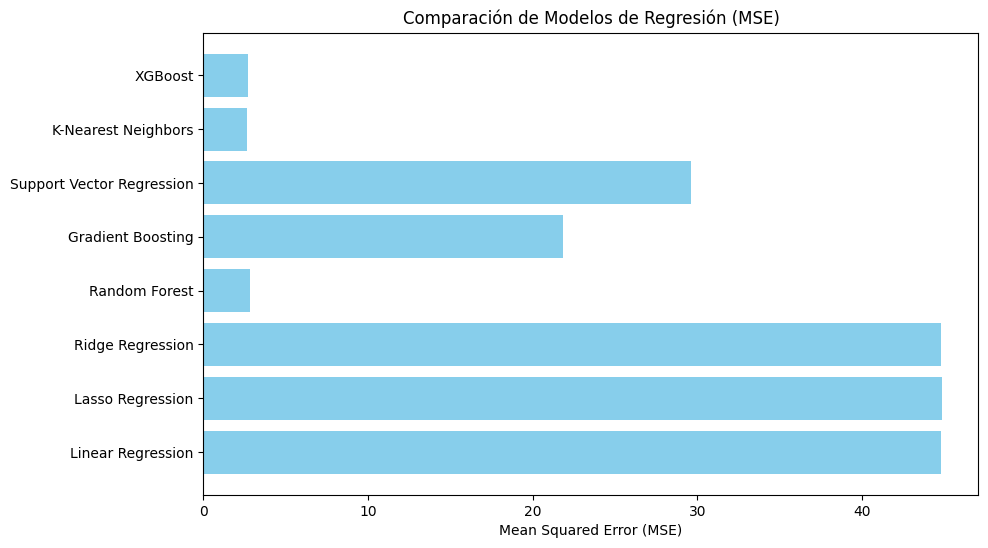

In [58]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error

# Crear diccionario para almacenar los resultados de MSE
results = {}

# Configurar la validación K-Fold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Realizar validación K-Fold y calcular el MSE para cada modelo
for name, model in models.items():
    mse_scores = []

    for train_index, val_index in kf.split(X_train):
        # Dividir los datos en entrenamiento y validación
        X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
        y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

        # Entrenar el modelo en el conjunto de entrenamiento
        model.fit(X_train_fold, y_train_fold)

        # Predecir en el conjunto de validación
        y_pred = model.predict(X_val_fold)

        # Calcular el MSE para esta partición
        mse = mean_squared_error(y_val_fold, y_pred)
        mse_scores.append(mse)

    # Calcular el MSE promedio para este modelo
    results[name] = np.mean(mse_scores)

# Convertir los resultados en un DataFrame para facilitar el análisis
results_df = pd.DataFrame(list(results.items()), columns=['Model', 'Mean Squared Error'])

# Mostrar el DataFrame con los resultados
print(results_df)

# Crear el gráfico de barras horizontales para comparar los modelos
plt.figure(figsize=(10, 6))
plt.barh(results_df['Model'], results_df['Mean Squared Error'], color='skyblue')
plt.xlabel('Mean Squared Error (MSE)')
plt.title('Comparación de Modelos de Regresión (MSE)')
plt.show()


En base al resultado se puede observar que el algoritmo K-Nearest Neighbors es el que presenta mayor desempeño con un error cuadrático medio promedio de 2.66. Este modelo será utilizado en la siguiente sección para optimizar su desempeño.

## Optimización de Modelos de Machine Learning

Para la optimización del modelo se decide utilizar el método RandomizedSearchCV para la búsqueda de hiperparámetros óptimos para el modelo. El siguiente fragmento de código aplica esta método aplicando 50 iteraciones de cálculo de error cuadrático medio y luego imprime la combinación de parámetros que mejor rendimiento presenta.

In [59]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
import numpy as np

# Definir el modelo base
knn = KNeighborsRegressor()

# Definir el espacio de búsqueda para los hiperparámetros
param_distributions = {
    'n_neighbors': np.arange(1, 31),         # Número de vecinos (1 a 30)
    'weights': ['uniform', 'distance'],     # Peso uniforme o basado en la distancia
    'p': [1, 2]                             # Distancia de Minkowski: 1=Manhattan, 2=Euclidiana
}

# Configurar RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=knn,
    param_distributions=param_distributions,
    n_iter=50,                              # Número de combinaciones aleatorias a probar
    scoring='neg_mean_squared_error',       # Métrica de evaluación (MSE negativo)
    cv=5,                                   # Validación cruzada con 5 particiones
    random_state=42,
    n_jobs=-1                               # Usar todos los núcleos disponibles
)

# Ajustar el modelo usando RandomizedSearchCV
random_search.fit(X_train, y_train)

# Mostrar los mejores hiperparámetros y el rendimiento asociado
print("Mejores hiperparámetros:", random_search.best_params_)
print("Mejor puntuación (MSE negativo):", random_search.best_score_)

# Evaluar el modelo en el conjunto de prueba
best_knn = random_search.best_estimator_
y_pred = best_knn.predict(X_test)
mse_test = mean_squared_error(y_test, y_pred)
print("MSE en el conjunto de prueba:", mse_test)



Mejores hiperparámetros: {'weights': 'distance', 'p': 1, 'n_neighbors': 2}
Mejor puntuación (MSE negativo): -0.671926575945203
MSE en el conjunto de prueba: 0.2518293204612376


Como se puede observar el desepeño del modelo optimizado tiene un error cuadrático medio de 0.25 mostrando una gran mejora respecto al modelo inicial. A continuación se grafica la totalidad de las predicciones realizadas contra el valor correcto, de esta forma se puede observar la distribución y magnitud que tienen los errores de predicción en todo el espectro de valores.

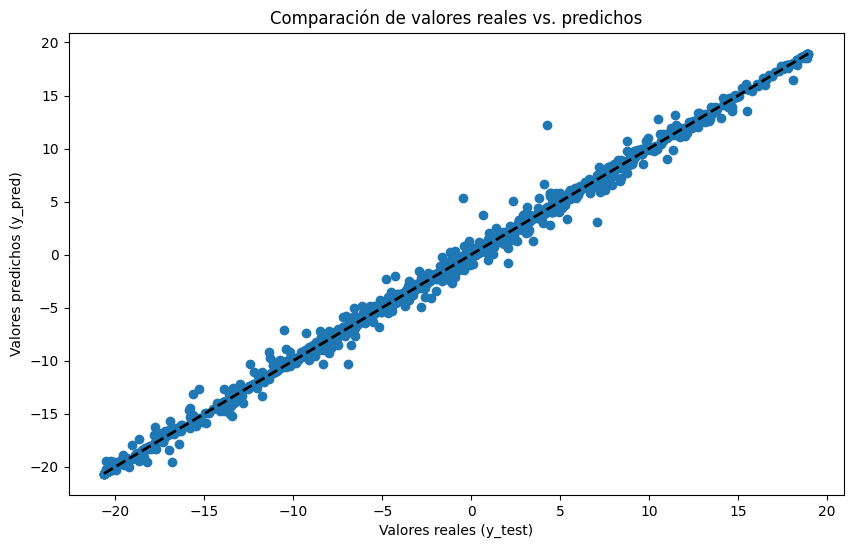

In [60]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred)
plt.xlabel("Valores reales (y_test)")
plt.ylabel("Valores predichos (y_pred)")
plt.title("Comparación de valores reales vs. predichos")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Línea de 45 grados para indicar predicciones perfectas
plt.show()

Como se puede observar, los valores se ajustan bien a la línea de 45 grados. Se observa que entre los valores 0 a 5 suelen producirse los errores más extremos de predicción. Para complementar la visualización de las predicciones del modelo se grafica los valores reales junto a los predichos en el tiempo utilizando el siguiente fragmento de código.

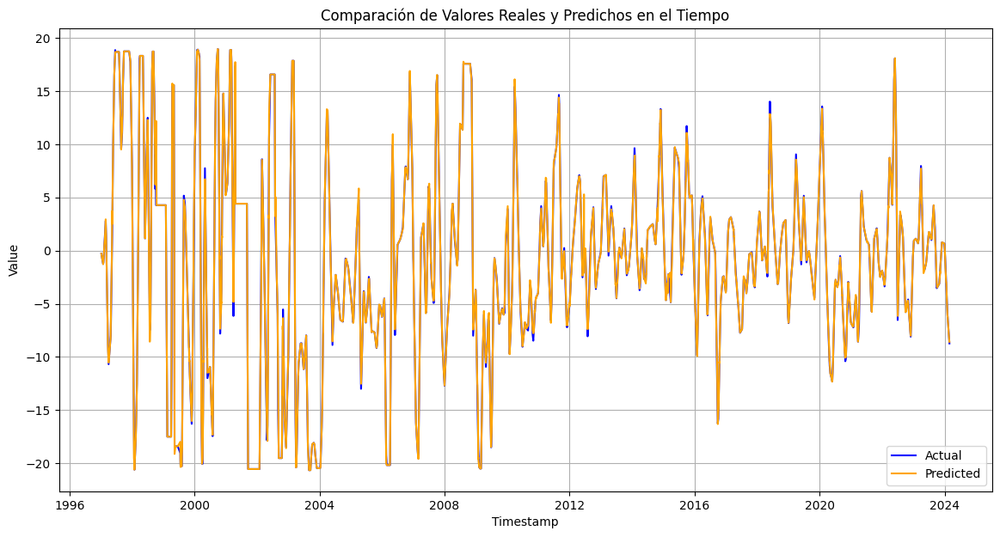

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Suponiendo que y_test y y_pred son DataFrames o Series con timestamps como índice

# Crear un DataFrame para comparar
comparison_df = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_pred
})

# Asegurar que ambos están alineados y ordenados por el índice (timestamp)
comparison_df = comparison_df.sort_index()

# Graficar la comparación
plt.figure(figsize=(14, 7))
plt.plot(comparison_df.index, comparison_df['Actual'], label='Actual', color='blue')
plt.plot(comparison_df.index, comparison_df['Predicted'], label='Predicted', color='orange')
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.title('Comparación de Valores Reales y Predichos en el Tiempo')
plt.legend()
plt.grid()
plt.show()


## Selección del Mejor Modelo